# **Predict change in b-cells in Tocilizumab treated samples**
In this notebook I use the models trained in the hyperparameter search in order to XXX



# **Imports**

In [554]:
# import the VAE code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
from scipy.stats import rankdata, wilcoxon, ttest_ind, ttest_rel, spearmanr, pearsonr
from sklearn.metrics import average_precision_score, f1_score


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet
import gseapy
import scipy

# programming stuff
import time
import os
import pickle
from pathlib import Path
from random import sample


# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [234]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_synovium_data/"
bulk_aug_data_path = f"{os.getcwd()}/../data/bulk_data/synovium/"
reference_data_path = f"{os.getcwd()}/../data/reference_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_synovium/"
clinical_file = f"{os.getcwd()}/../data/single_cell_data/synovium/metadata_clin_donor_singlecell.csv"

# results files for cibersort and bayesprism
cibersort_00_bulk_path = f"{os.getcwd()}/../results/bulk/CIBERSORTx_Job43_00_Results.csv"
cibersort_01_bulk_path = f"{os.getcwd()}/../results/bulk/CIBERSORTx_Job43_01_Results.csv"
cibersort_bulk_path = f"{os.getcwd()}/../results/bulk/CIBERSORTx_Job43_Results.csv"
bp_bulk_path = f"{os.getcwd()}/../results/single_cell_data/bp_synovium/bp_tocilizumab_prop.tsv"
bp_00_bulk_path = f"{os.getcwd()}/../results/single_cell_data/bp_synovium/bp_tocilizumab_prop_00.tsv"
bp_01_bulk_path = f"{os.getcwd()}/../results/single_cell_data/bp_synovium/bp_tocilizumab_prop_01.tsv"
bp_bulk_Z_path = f"{os.getcwd()}/../results/single_cell_data/bp_synovium/bp_tocilizumab_Z.tsv"
bp_bulk_Zmeta_path = f"{os.getcwd()}/../results/single_cell_data/bp_synovium/bp_tocilizumab_Z_meta.tsv"


gmt_path = f"{os.getcwd()}/../data/metadata/h.all.v2023.2.Hs.symbols.gmt"


cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_synovium/"


cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_synovium/" +
                        "CIBERSORTx_Job42_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job42_test_cybersort_sig_inferred_refsample.bm.K999.txt")

num_genes = 7000


exp_id = "all-synovium"
res_id = "toc-synovium"
curr_treatment = "Tocilizumab"

RUN_CIBERSORT_GENES = True


# Set-up experimental variables

In [15]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 8

# number of patients/domains/samples expected
n_tot_samples = 83 # 12 bulk and 11 single cell samples
n_tot_samples = 76 # 72 bulk and 4 single cell samples
n_tot_samples = 108 # 101 bulk and 7 single cell samples
n_tot_samples = 79 # 72 bulk and 7 single cell samples
n_tot_samples = 19 # 12 bulk and 7 single cell samples -- Ritixumab
n_tot_samples = 23 # 16 bulk and 7 single cell samples -- Tocilizumab

# number of drugs (in this case sexes used for prediction)
# one-hot encoded
n_drugs = 2

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [16]:
in_name = f"synovium_bulk_processed_{curr_treatment}"


# read in the real bulk data
processed_sc_file = f"{bulk_aug_data_path}/{in_name}.h5ad"
adata = sc.read_h5ad(processed_sc_file)

responder_ids = ['R4RAPAT00027', 'R4RAPAT00047','R4RAPAT00060',
                'R4RAPAT00110', 'R4RAPAT00129', 'R4RAPAT00140', ]

non_responderids = [ 'R4RAPAT00056', 'R4RAPAT00066', 'R4RAPAT00072', 
                    'R4RAPAT00099', 'R4RAPAT00107', 'R4RAPAT00114', 
                    'R4RAPAT00117', 'R4RAPAT00118', 'R4RAPAT00142', 'R4RAPAT00145']



# now get the sc ref training data

# read in order
sample_order = ['BRI-462', 'BRI-566', 'BRI-458', 'BRI-460', 'BRI-421', 'BRI-601',
                'BRI-605', 'BRI-515', 'BRI-415', 'BRI-623', 'BRI-436']
sample_order = ['BRI-601', 'BRI-623', 'BRI-605', 'BRI-566']
sample_order = ['BRI-462', 'BRI-458', 'BRI-460', 'BRI-421',
                'BRI-515', 'BRI-415', 'BRI-436']


X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])


# format the bulk data
real_bulk_df = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# now we have a new gene_df
gene_df = pd.DataFrame(intersect_genes)
gene_df.columns = ["gene_ids"]
gene_df.set_index(gene_df["gene_ids"])
gene_df = gene_df.gene_ids

# get the bulk metadata formatted
real_bulk_meta_df['response'] = real_bulk_meta_df['cdai_response_status'].astype(str)
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim", "response"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)

meta_concat['response'] = 'Non.Responder'


# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(real_bulk_df.shape[0])]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])

# add clinical info
clinical_df = pd.read_csv(clinical_file)
clinical_df = meta_df.merge(clinical_df, left_on="sample_id", right_on="mRNA_run", how='left')
meta_df = clinical_df

# update technologies
#sc_tech_idx = np.where(meta_df.samp_type == "sc_ref")[0]
#meta_df.samp_type.iloc[sc_tech_idx] = meta_df.single_cell_tech.iloc[sc_tech_idx]

# index for checking correlations
sc_idx = np.where(meta_df.samp_type != "bulk")[0]
bulk_idx = np.where(meta_df.samp_type == "bulk")[0]



BRI-462
BRI-458
BRI-460
BRI-421
BRI-515
BRI-415
BRI-436


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2631951157.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["isTraining"] = "Train"
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2631951157.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["cell_prop_type"] = "realistic"
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2631951157.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

In [17]:
tab = meta_df.groupby(['samp_type', 'response']).size()
tab.unstack()

response,Non.Responder,Responder
samp_type,,
bulk,20.0,12.0
sc_ref,40600.0,NaN


### format sample indicies and get variable genes

In [18]:
meta_df.isTraining.unique()

array(['Train'], dtype=object)

In [19]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim == "STIM")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)



# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    #CoV_only = top_gene_df
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] # num_genes to get 7000
gene_df = gene_df.iloc[idx_top]


In [20]:
X_orig

array([[3.7000e+01, 3.0000e+00, 1.1000e+02, ..., 9.5000e+01, 1.0800e+02,
        4.5000e+01],
       [2.2000e+01, 2.0000e+00, 7.4000e+01, ..., 1.1700e+02, 1.6500e+02,
        3.9000e+01],
       [1.4000e+01, 2.0000e+00, 8.4000e+01, ..., 8.6000e+01, 1.2000e+02,
        4.9000e+01],
       ...,
       [3.4900e+02, 4.9000e+01, 2.1424e+04, ..., 8.4800e+02, 7.0270e+03,
        2.3960e+03],
       [5.4400e+02, 2.0000e+00, 2.7840e+03, ..., 6.8600e+02, 5.6300e+02,
        3.9800e+02],
       [3.0300e+02, 3.4000e+01, 1.4574e+04, ..., 7.1300e+02, 5.7460e+03,
        1.8290e+03]])

In [21]:
X_CoV.shape

(16153,)

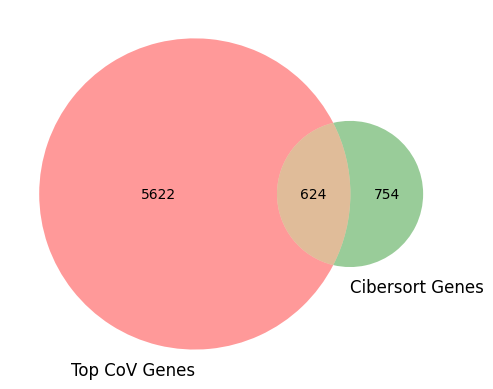

In [22]:
venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [23]:
union_genes = np.union1d(gene_df, cibersort_genes)
#union_genes = gene_df
len(union_genes)

7000

In [24]:
np.any(np.isin(union_genes, ["PRDM1"]))

True

### normalize

In [25]:
X_full = X_full.loc[:,union_genes]

# rescale sc_ref and bulks
median_sc_ref = np.median(np.quantile(X_full.iloc[sc_idx], axis=1, q=0.9))
median_bulk = np.median(np.quantile(X_full.iloc[bulk_idx], axis=1, q=0.9))

ratio_medians = median_bulk/median_sc_ref

X_full.iloc[sc_idx] = X_full.iloc[sc_idx]*ratio_medians


In [26]:

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


### plot data

In [27]:
idx_tmp = np.random.choice(range(X_full.shape[0]), 5000, replace=True)
idx_tmp

array([34699, 22957,   235, ..., 24749, 14224, 27425])

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.009s...
[t-SNE] Computed neighbors for 5000 samples in 2.558s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.110854
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.320908
[t-SNE] KL divergence after 500 iterations: 1.200606
(5000, 2)
(5000, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2600809812.py:28: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


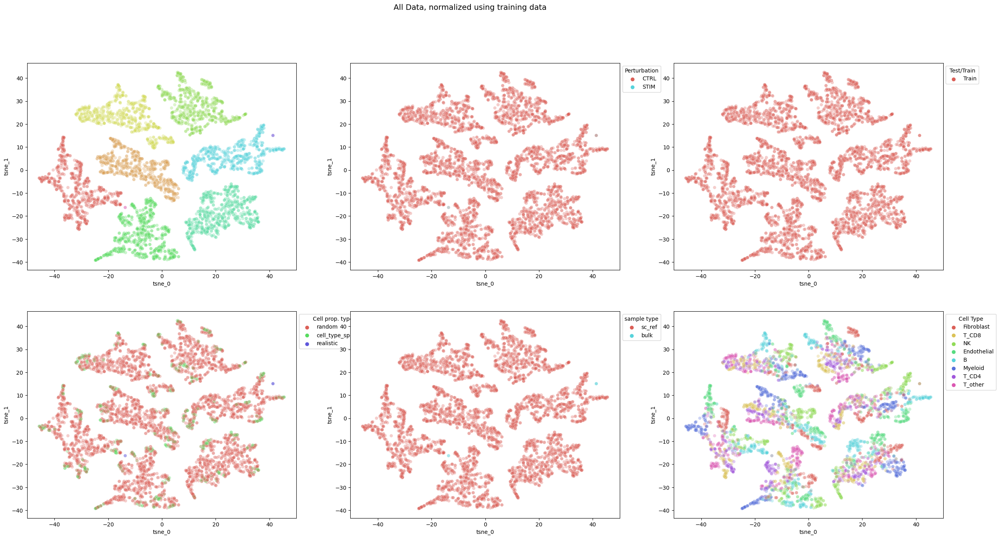

In [28]:
## plot samples

idx_tmp = np.random.choice(range(X_full.shape[0]), 5000, replace=True)

plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

# this is a vector that represents the cell-type with 
# the highest proportion 
Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 
Y_temp = Y_full.columns[Y_temp]


vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"", legend_title="Sample ID")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].stim.to_numpy(), axs[0,1], title=f"", legend_title="Perturbation")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"", legend_title="Test/Train")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cell_prop_type.to_numpy(), axs[1,0], title=f"", legend_title="Cell prop. type")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].samp_type.to_numpy(), axs[1,1], title=f"", legend_title="sample type")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"", legend_title="Cell Type")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(32, 2)
(32, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2821073111.py:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


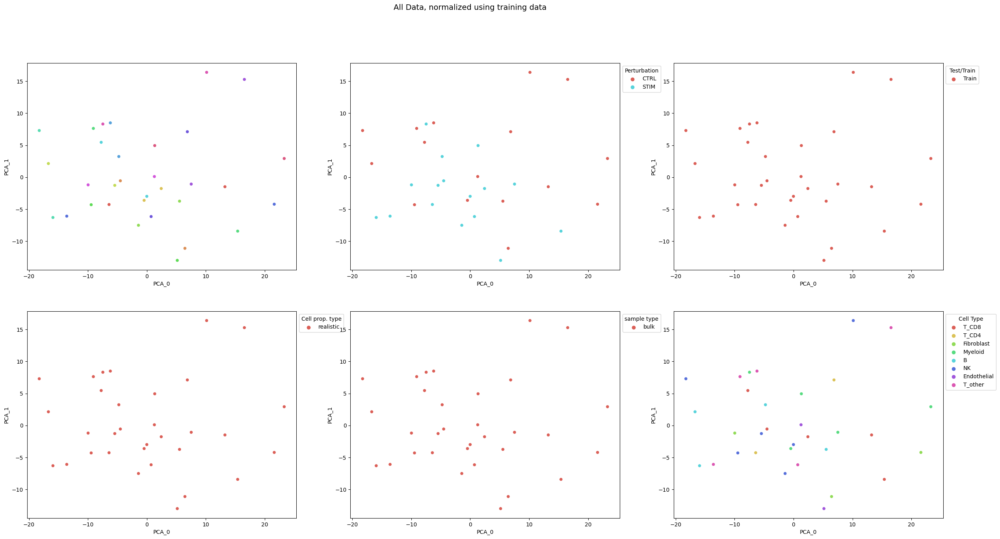

In [29]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 
Y_temp = Y_full.columns[Y_temp]

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1, legend_title="Sample ID")
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1, legend_title="Perturbation")
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1, legend_title="Test/Train")
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1, legend_title="Cell prop. type")
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1, legend_title="sample type")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1, legend_title="Cell Type")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.001s...
[t-SNE] Computed neighbors for 32 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 13.369884
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.740921
[t-SNE] KL divergence after 500 iterations: 0.066505
(32, 2)
(32, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2955274557.py:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


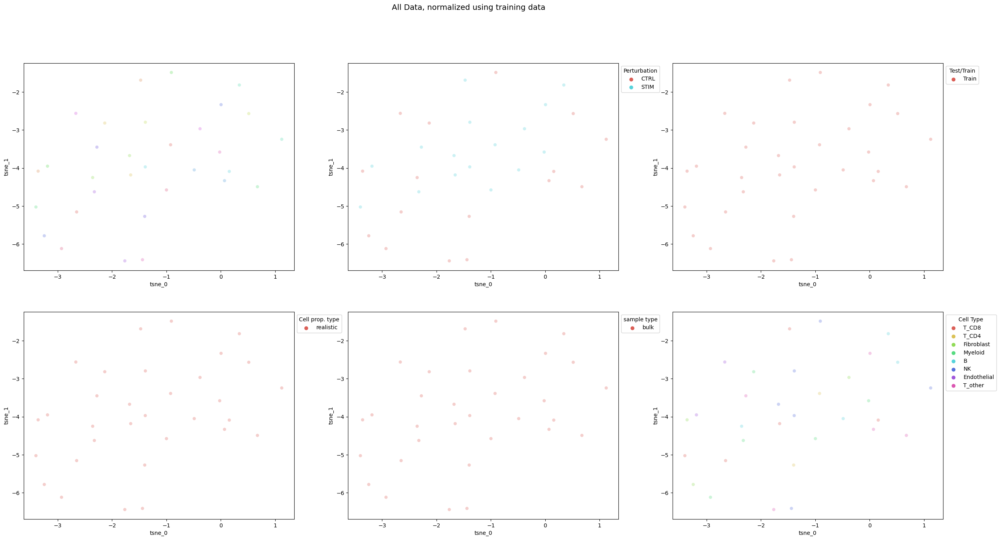

In [30]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 
Y_temp = Y_full.columns[Y_temp]

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], alpha=1, title=f"", legend_title="Sample ID")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], alpha=1, title=f"", legend_title="Perturbation")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], alpha=1, title=f"", legend_title="Test/Train")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], alpha=1, title=f"", legend_title="Cell prop. type")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], alpha=1, title=f"", legend_title="sample type")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"", alpha=1, legend_title="Cell Type")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Read in Trained Models**

In [31]:

res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_classifier")

"""
res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_classifier")

"""


2024-01-26 14:53:42.625136: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-01-26 14:53:42.695726: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_17' id:290 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_17}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_6, Identity_17)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-01-26 14:53:43.474058: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_30' id:651 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_30}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_23, Identity_30)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-01-26 14:53:44.008810: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_48' id:833 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_48}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_24, Identity_48)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-01-26 14:53:44.310023: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_53' id:920 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_53}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_26, Identity_53)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


'\nres2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_unlab")\nres2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_lab")\nres2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_decoder")\nres2_classifier = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_classifier")\n\n\nres3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_unlab")\nres3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_lab")\nres3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_decoder")\nres3_classifier = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_classifier")\n\n'

## Do latent space projectsions

### drug perturbation

In [265]:

res1_meta_df, res1_decoded_0_0, res1_decoded_0_1, res1_top_genes = buddi.calc_buddi_perturbation(meta_df, X_full, Y_full, scaler, 
                                                                            res1_enc_unlab, res1_dec, batch_size=500, 
                                                                            genes_ordered=union_genes, 
                                                                            top_lim=100, use_buddi4=True)

"""

res2_meta_df, res2_decoded_0_0, res2_decoded_0_1, res2_top_genes = buddi.calc_buddi_perturbation(meta_df, X_full, Y_full, scaler, 
                                                                            res2_enc_unlab, res2_dec, batch_size=500, 
                                                                            genes_ordered=union_genes, 
                                                                            top_lim=100, use_buddi4=True)


res3_meta_df, res3_decoded_0_0, res3_decoded_0_1, res3_top_genes = buddi.calc_buddi_perturbation(meta_df, X_full, Y_full, scaler, 
                                                                            res3_enc_unlab, res3_dec, batch_size=500, 
                                                                            genes_ordered=union_genes, 
                                                                            top_lim=100, use_buddi4=True)
"""


/Users/davidnat/Documents/projects/greenelab/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/Users/davidnat/Documents/projects/greenelab/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"


'\n\nres2_meta_df, res2_decoded_0_0, res2_decoded_0_1, res2_top_genes = buddi.calc_buddi_perturbation(meta_df, X_full, Y_full, scaler, \n                                                                            res2_enc_unlab, res2_dec, batch_size=500, \n                                                                            genes_ordered=union_genes, \n                                                                            top_lim=100, use_buddi4=True)\n\n\nres3_meta_df, res3_decoded_0_0, res3_decoded_0_1, res3_top_genes = buddi.calc_buddi_perturbation(meta_df, X_full, Y_full, scaler, \n                                                                            res3_enc_unlab, res3_dec, batch_size=500, \n                                                                            genes_ordered=union_genes, \n                                                                            top_lim=100, use_buddi4=True)\n'

In [283]:
idx_cell_type_specific = np.where(res1_meta_df.cell_prop_type == "cell_type_specific")

decoded_0_0_df = pd.DataFrame(res1_decoded_0_0)
decoded_0_0_df.columns = union_genes
decoded_0_0_df.index = res1_meta_df.Y_max.to_list()
decoded_0_0_df = decoded_0_0_df.iloc[idx_cell_type_specific]
decoded_0_0_df = decoded_0_0_df.T


sig_out_file = os.path.join(cibersort_path, f"test_cybersort_sig_0_0.tsv.gz")
sig_out_path = Path(sig_out_file)
decoded_0_0_df = decoded_0_0_df.astype('int')
decoded_0_0_df.to_csv(sig_out_path, sep='\t',header=True)


decoded_0_1_df = pd.DataFrame(res1_decoded_0_1)
decoded_0_1_df.columns = union_genes
decoded_0_1_df.index = res1_meta_df.Y_max.to_list()
decoded_0_1_df = decoded_0_1_df.iloc[idx_cell_type_specific]
decoded_0_1_df = decoded_0_1_df.T


sig_out_file = os.path.join(cibersort_path, f"test_cybersort_sig_0_1.tsv.gz")
sig_out_path = Path(sig_out_file)
decoded_0_1_df = decoded_0_1_df.astype('int')
decoded_0_1_df.to_csv(sig_out_path, sep='\t',header=True)


In [33]:
res1_top_genes["B"]

['CCL13',
 'CCL18',
 'CLEC10A',
 'CD209',
 'SCG2',
 'CILP2',
 'ACAN',
 'FABP4',
 'TGM2',
 'TMEM176A',
 'FCGR1A',
 'CXCL8',
 'FCGR3B',
 'MS4A4A',
 'IL4I1',
 'SLAMF7',
 'CFP',
 'GFRA2',
 'ALPL',
 'CXCL10',
 'CXCL3',
 'IGKV1-5',
 'EDIL3',
 'SLC39A8',
 'CR1',
 'GBP5',
 'TPSB2',
 'CD163L1',
 'NR4A1',
 'FAM20A',
 'LBP',
 'SLAMF8',
 'FCGR2B',
 'SMOC1',
 'TNFRSF21',
 'CCL2',
 'ADGRA3',
 'SPP1',
 'PTPRD',
 'ENPP1',
 'RARRES2',
 'FCN1',
 'PLIN1',
 'IGLC3',
 'CRISPLD1',
 'SDK2',
 'CD300E',
 'HLA-DQA2',
 'FAM118A',
 'IL1B',
 'HSPA6',
 'COL27A1',
 'CXCL2',
 'IGLV2-11',
 'CXCL9',
 'LILRB1',
 'HSPA2',
 'AOX1',
 'RARRES1',
 'ACSL1',
 'SECTM1',
 'C2',
 'NREP',
 'DIO2',
 'TMEM37',
 'PDK4',
 'CA5B',
 'LRRC25',
 'NR1H3',
 'ABCG1',
 'IQGAP2',
 'DRAM1',
 'CD36',
 'IQCN',
 'TSPAN2',
 'CXCL1',
 'CADM1',
 'XYLT1',
 'FABP5',
 'PLA2G2D',
 'DHRS3',
 'NTN1',
 'CACNA1A',
 'NPL',
 'CD40',
 'AKAP12',
 'ABCA6',
 'COL8A2',
 'ATF5',
 'LCP2',
 'SYNJ2',
 'OLFML2A',
 'SLA',
 'SMPDL3A',
 'CA12',
 'IGHV1-18',
 'NINJ1',
 'ITG

"\ncell_diff = from_contents(res2_top_genes)\nax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()\n\ncell_diff = from_contents(res3_top_genes)\nax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()\n"

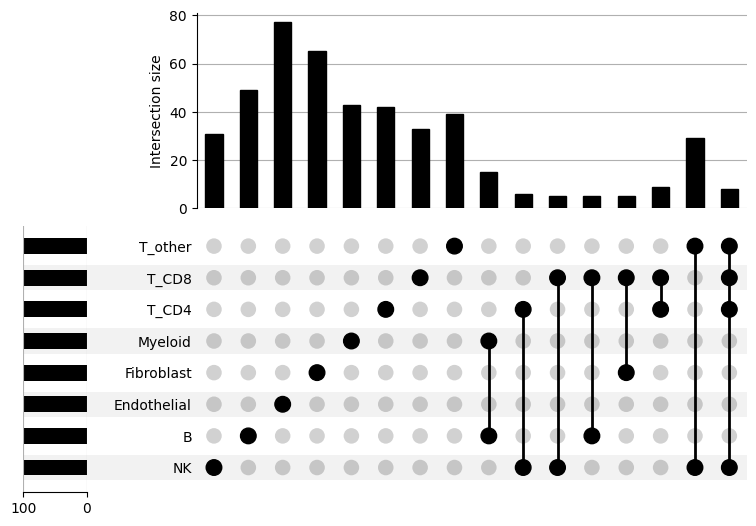

In [34]:
# identify how cell-type specific the DE genes are
cell_diff = from_contents(res1_top_genes)
ax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()
"""
cell_diff = from_contents(res2_top_genes)
ax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()

cell_diff = from_contents(res3_top_genes)
ax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()
"""



In [35]:
res1_top_genes

{'NK': ['DMKN',
  'LAMB2',
  'MYO1C',
  'MYH11',
  'PTPRS',
  'MXRA8',
  'TNFAIP2',
  'CCNL2',
  'MMP13',
  'LENG8',
  'MEGF6',
  'CTDSP2',
  'TPPP',
  'SPTAN1',
  'VAT1',
  'OGT',
  'SPEG',
  'C1R',
  'ILF3',
  'IGHG4',
  'UBA1',
  'SLPI',
  'ACTN4',
  'MZB1',
  'ADAM33',
  'NOTCH3',
  'SYNPO2',
  'MAPK8IP3',
  'NTRK2',
  'TFF3',
  'AMTN',
  'CARMN',
  'CCL18',
  'ESYT2',
  'CALD1',
  'DSP',
  'C7',
  'IL1RN',
  'CSPG4',
  'ITGA7',
  'IGFBP3',
  'CSRP1',
  'STC1',
  'C6',
  'CD300E',
  'SEL1L3',
  'TENT5C',
  'TNC',
  'MT1H',
  'CDH23',
  'ARHGEF17',
  'SELE',
  'CYBRD1',
  'ENGASE',
  'MYO15B',
  'CEP170B',
  'FBP1',
  'CNN1',
  'AMOTL2',
  'SLC39A8',
  'HP',
  'TGM2',
  'JCHAIN',
  'NONO',
  'KCTD12',
  'IGLV2-23',
  'TMEM94',
  'TNMD',
  'ACACB',
  'IL7R',
  'NFE2L1',
  'EWSR1',
  'STAB1',
  'TAC1',
  'LOX',
  'CCL21',
  'SNX33',
  'NNAT',
  'PLIN4',
  'PPP1R12B',
  'CCL23',
  'LGI4',
  'ITGAX',
  'ADCY6',
  'MAST2',
  'TEF',
  'SBSN',
  'ZNF423',
  'ISLR',
  'ABCC3',
  'IGLV3-1',


In [40]:
# make anndata for BuDDI
import anndata as ad
adata_counts = np.append(res1_decoded_0_0, res1_decoded_0_1, axis=0)
adata_df = pd.DataFrame(adata_counts)
adata_df.columns = union_genes

ad_union_genes = pd.DataFrame(union_genes)
ad_union_genes.index = union_genes

res1_meta_df_stim = res1_meta_df.copy()
res1_meta_df_stim.stim = "STIM"
res1_meta_df_obs = res1_meta_df.append(res1_meta_df_stim)

adata = ad.AnnData(adata_df, obs=res1_meta_df_obs, var=ad_union_genes)

common_genes = np.intersect1d(union_genes, ['IL6R', 'PRDM1'])
sc.tl.score_genes(adata, common_genes)




/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/261498516.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1_meta_df_obs = res1_meta_df.append(res1_meta_df_stim)
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version

In [203]:
# make anndata for BayesPrism
import anndata as ad

## get with bayesprism
bp_bulk = pd.read_csv(bp_bulk_Z_path, delimiter="\t")
bp_bulk_meta = pd.read_csv(bp_bulk_Zmeta_path, delimiter="\t")



def get_stim_id(in_str):
    out_str = "STIM"
    if in_str == "week0":
        out_str = "CTRL"
           
    return(out_str)

bp_bulk_meta['stim'] = [get_stim_id(str(x)) for x in bp_bulk_meta["time"].tolist()]



bp_adata_df = pd.DataFrame(bp_bulk)
bp_union_genes = np.intersect1d(bp_adata_df.columns, union_genes)
bp_adata_df = bp_adata_df[bp_union_genes]

ad_bp_union_genes = pd.DataFrame(bp_union_genes)
ad_bp_union_genes.index = bp_union_genes


# format meta data
bp_bulk_meta["Y_max"] = bp_bulk_meta.cell_type


# make anndata
bp_adata = ad.AnnData(bp_adata_df, obs=bp_bulk_meta, var=ad_bp_union_genes)




/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/anndata/utils.py:143: UserWarning: X converted to numpy array with dtype float64
  warnings.warn(f"{name} converted to numpy array with dtype {arr.dtype}")
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3753455989.py:32: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  bp_adata = ad.AnnData(bp_adata_df, obs=bp_bulk_meta, var=ad_bp_union_genes)
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [43]:
import gseapy as gp
from gseapy import GSEA

def run_gsea(cell_type_list, gmt_path, adata, adata_df):


    cell_idx = np.where(np.isin(adata.obs.Y_max, cell_type_list))[0]


    hall_mark = gp.read_gmt(path=gmt_path)
    class_vector = adata[cell_idx, :].obs.stim.to_list() # STIM vs CTRL
    adata_gsea = adata_df.iloc[cell_idx].T
    adata_gsea["Gene"] = adata_gsea.index

    gs = GSEA(data=adata_gsea,
            gene_sets=hall_mark,
            classes = class_vector, # cls=class_vector
            # set permutation_type to phenotype if samples >=15
            permutation_type='phenotype',
            permutation_num=1000, # reduce number to speed up test
            outdir=None,
            method='ratio_of_classes',
            threads=4, seed= 8)
    gs.pheno_pos = "CTRL"
    gs.pheno_neg = "STIM"
    gs.run()

    return gs

<AxesSubplot: title={'center': 'HALLMARK_IL6_JAK_STAT3_SIGNALING'}, xlabel='NES'>

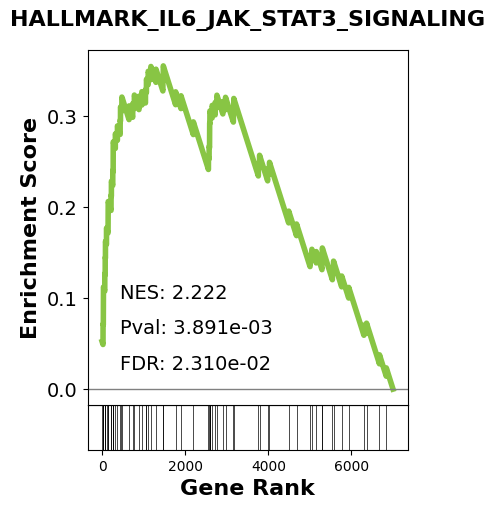

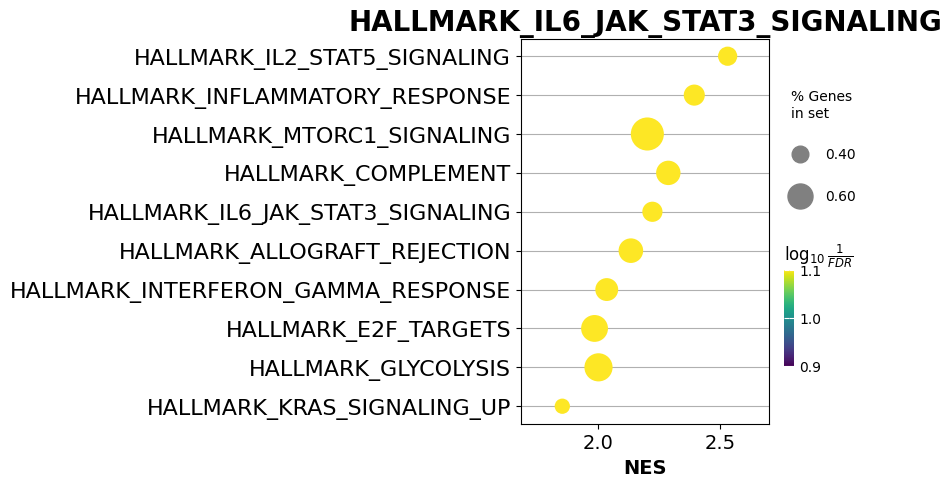

In [44]:
cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other"]

gs_res_imm = run_gsea(cell_type_list, gmt_path, adata, adata_df)


hallmark_idx = np.where(np.isin(gs_res_imm.res2d.Term, ["HALLMARK_IL6_JAK_STAT3_SIGNALING"]))[0]
terms = gs_res_imm.res2d.Term[hallmark_idx].tolist()


gs_res_imm.plot(terms[0], show_ranking=False, legend_kws={'loc': (1.05, 0)})

gp.dotplot(gs_res_imm.res2d,
             column="FDR q-val",
             title='HALLMARK_IL6_JAK_STAT3_SIGNALING',
             cmap=plt.cm.viridis,
             size=5,
             figsize=(4,5), cutoff=1)



<AxesSubplot: title={'center': 'HALLMARK_IL6_JAK_STAT3_SIGNALING'}, xlabel='NES'>

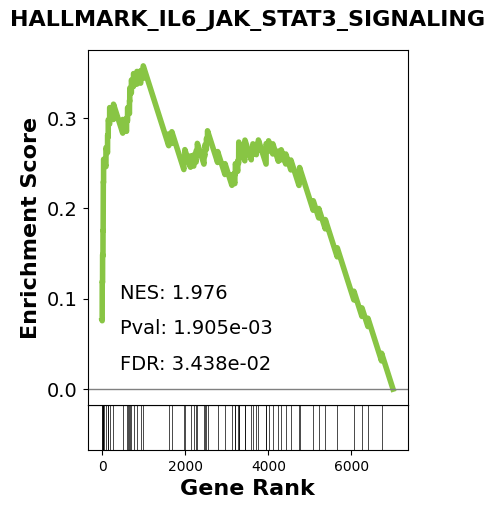

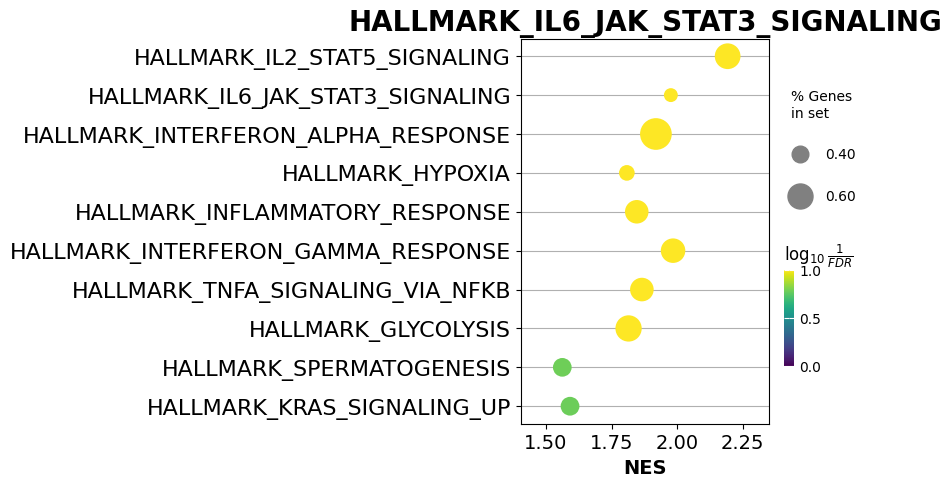

In [45]:
cell_type_list = ["Endothelial", "Fibroblast"]

gs_res_nonimm = run_gsea(cell_type_list, gmt_path, adata, adata_df)


hallmark_idx = np.where(np.isin(gs_res_nonimm.res2d.Term, ["HALLMARK_IL6_JAK_STAT3_SIGNALING"]))[0]
terms = gs_res_nonimm.res2d.Term[hallmark_idx].tolist()


gs_res_nonimm.plot(terms[0], show_ranking=False, legend_kws={'loc': (1.05, 0)})

gp.dotplot(gs_res_nonimm.res2d,
             column="FDR q-val",
             title='HALLMARK_IL6_JAK_STAT3_SIGNALING',
             cmap=plt.cm.viridis,
             size=5,
             figsize=(4,5), cutoff=1)



<AxesSubplot: title={'center': 'HALLMARK_IL6_JAK_STAT3_SIGNALING'}, xlabel='NES'>

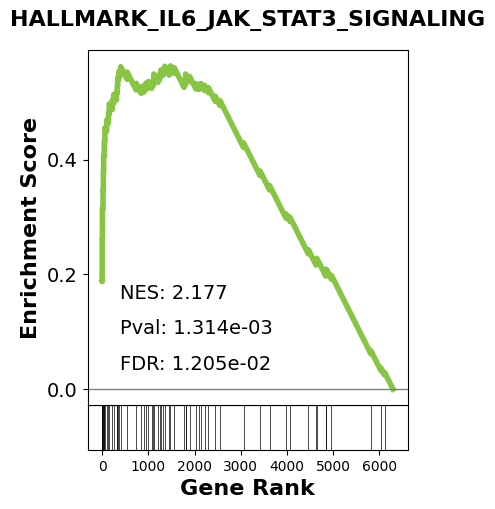

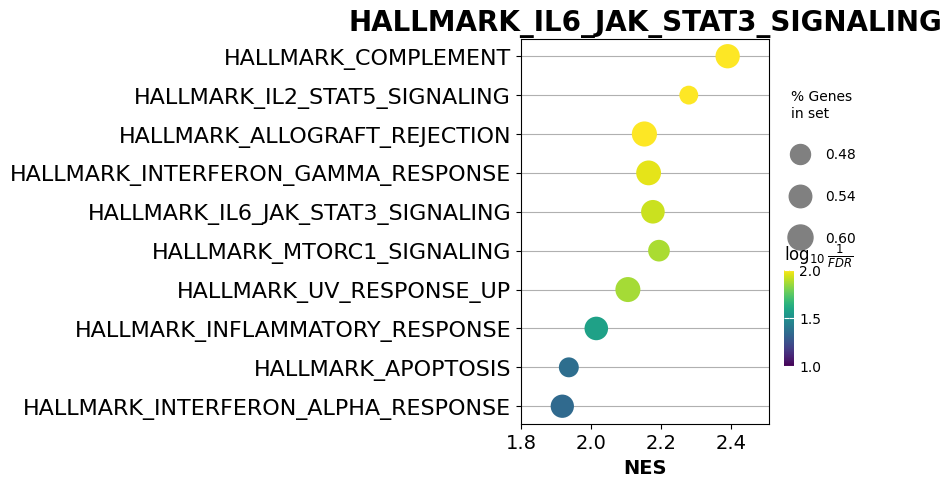

In [204]:
## BayesPrism 

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other"]

gs_res_imm = run_gsea(cell_type_list, gmt_path, bp_adata, bp_adata_df)


hallmark_idx = np.where(np.isin(gs_res_imm.res2d.Term, ["HALLMARK_IL6_JAK_STAT3_SIGNALING"]))[0]
terms = gs_res_imm.res2d.Term[hallmark_idx].tolist()


gs_res_imm.plot(terms[0], show_ranking=False, legend_kws={'loc': (1.05, 0)})

gp.dotplot(gs_res_imm.res2d,
             column="FDR q-val",
             title='HALLMARK_IL6_JAK_STAT3_SIGNALING',
             cmap=plt.cm.viridis,
             size=5,
             figsize=(4,5), cutoff=1)

<AxesSubplot: title={'center': 'HALLMARK_IL6_JAK_STAT3_SIGNALING'}, xlabel='NES'>

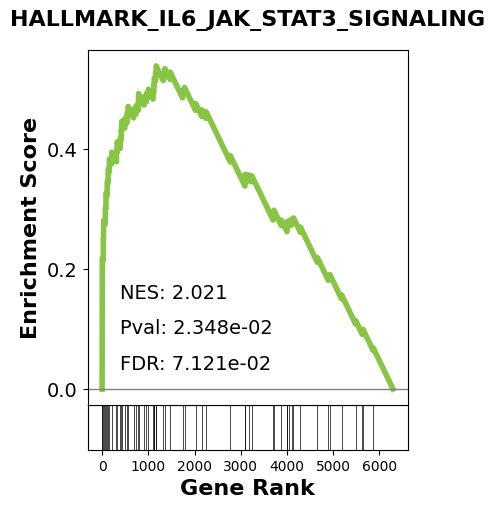

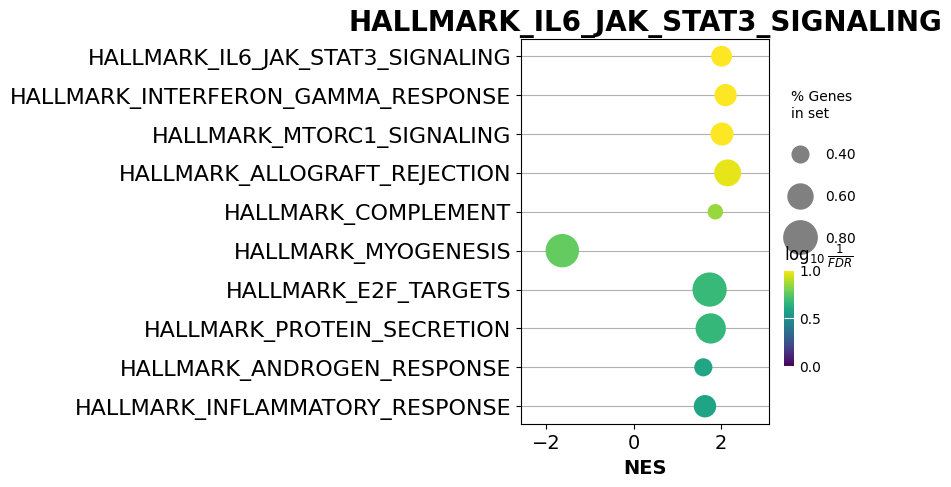

In [205]:
## BayesPrism 

cell_type_list = ["Endothelial", "Fibroblast"]

gs_res_imm = run_gsea(cell_type_list, gmt_path, bp_adata, bp_adata_df)


hallmark_idx = np.where(np.isin(gs_res_imm.res2d.Term, ["HALLMARK_IL6_JAK_STAT3_SIGNALING"]))[0]
terms = gs_res_imm.res2d.Term[hallmark_idx].tolist()


gs_res_imm.plot(terms[0], show_ranking=False, legend_kws={'loc': (1.05, 0)})

gp.dotplot(gs_res_imm.res2d,
             column="FDR q-val",
             title='HALLMARK_IL6_JAK_STAT3_SIGNALING',
             cmap=plt.cm.viridis,
             size=5,
             figsize=(4,5), cutoff=1)

In [224]:

def get_cell_score(gmt_path, adata, adata_df, curr_cell_type):

    curr_adata = adata.copy()
    curr_adata_df = adata_df.copy()

    cell_idx = np.where(np.isin(curr_adata.obs.Y_max, [curr_cell_type]))[0]

    curr_adata_df.index = [m+str(n) for m,n in zip(["name_"]*curr_adata_df.shape[0], curr_adata_df.index )]

    hall_mark = gp.read_gmt(path=gmt_path)
    adata_gsea = curr_adata_df.iloc[cell_idx].T
    adata_gsea["Gene"] = adata_gsea.index


    es = gp.gsva(adata_gsea, gene_sets=hall_mark)

    scores_df = pd.DataFrame(es.res2d.pivot(index='Name', columns='Term', values='ES'))
    scores_df["Name_merge"] = scores_df.index.to_list()

    gsva_adata = curr_adata
    gsva_adata.obs["Name_merge"] = [m+str(n) for m,n in zip(["name_"]*curr_adata_df.shape[0], range(curr_adata_df.shape[0]) )]

    gsva_adata = gsva_adata.obs.merge(scores_df, on="Name_merge")

    return gsva_adata


def get_cell_score_all(gmt_path, adata, adata_df, kcdf="Gaussian"):

    curr_adata = adata.copy()
    curr_adata_df = adata_df.copy()

    sample_size = np.min([2000, curr_adata_df.shape[0]])
    cell_idx = sample(range(curr_adata_df.shape[0]), sample_size)

    curr_adata_df.index = [m+str(n) for m,n in zip(["name_"]*curr_adata_df.shape[0], curr_adata_df.index )]

    hall_mark = gp.read_gmt(path=gmt_path)
    adata_gsea = curr_adata_df.iloc[cell_idx].T
    adata_gsea["Gene"] = adata_gsea.index


    es = gp.gsva(adata_gsea, gene_sets=hall_mark, kcdf=kcdf)

    scores_df = pd.DataFrame(es.res2d.pivot(index='Name', columns='Term', values='ES'))
    scores_df["Name_merge"] = scores_df.index.to_list()

    gsva_adata = curr_adata
    gsva_adata.obs["Name_merge"] = [m+str(n) for m,n in zip(["name_"]*curr_adata_df.shape[0], range(curr_adata_df.shape[0]) )]

    gsva_adata = gsva_adata.obs.merge(scores_df, on="Name_merge")

    return gsva_adata

In [229]:
curr_pathway = "HALLMARK_IL6_JAK_STAT3_SIGNALING"
gsva_adata = get_cell_score_all(gmt_path, adata, adata_df, kcdf="Poisson")



/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [230]:
gsva_adata

,sample_id,stim,isTraining,cell_prop_type,samp_type,response,subject_id,pipeline_date,site,treatment,...,HALLMARK_PROTEIN_SECRETION,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,HALLMARK_SPERMATOGENESIS,HALLMARK_TGF_BETA_SIGNALING,HALLMARK_TNFA_SIGNALING_VIA_NFKB,HALLMARK_UNFOLDED_PROTEIN_RESPONSE,HALLMARK_UV_RESPONSE_DN,HALLMARK_UV_RESPONSE_UP,HALLMARK_WNT_BETA_CATENIN_SIGNALING,HALLMARK_XENOBIOTIC_METABOLISM
0,BRI-515,CTRL,Test,cell_type_specific,sc_ref,Non.Responder,300-0504,9/17/19,UK Birmingham,1,...,-0.308561,-0.526388,0.147934,-0.307823,0.167092,-0.062904,-0.296359,-0.093483,-0.025698,-0.086258
1,BRI-515,CTRL,Test,cell_type_specific,sc_ref,Non.Responder,300-0504,9/17/19,UK Birmingham,1,...,-0.185115,-0.107424,0.242248,-0.316073,0.264798,-0.027004,-0.211144,-0.116961,-0.222769,0.090203
2,BRI-515,CTRL,Test,cell_type_specific,sc_ref,Non.Responder,300-0504,9/17/19,UK Birmingham,1,...,-0.399108,-0.549599,0.185612,0.162471,0.276775,-0.237264,0.115156,-0.129891,-0.072064,-0.223338
3,BRI-460,CTRL,Test,cell_type_specific,sc_ref,Non.Responder,300-0173,8/22/19,Hospital for Special Surgery,1,...,0.186681,0.379097,0.059453,-0.213457,0.26786,0.403038,-0.419921,0.246176,-0.485138,0.253694
4,BRI-421,CTRL,Test,cell_type_specific,sc_ref,Non.Responder,300-0501,8/12/19,UK Birmingham,1,...,-0.309866,-0.140631,0.214947,-0.194242,-0.261214,-0.116811,-0.407193,0.053921,-0.132381,0.06139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,BRI-460,STIM,Test,cell_type_specific,sc_ref,Non.Responder,300-0173,8/22/19,Hospital for Special Surgery,1,...,-0.011457,0.278256,-0.231102,-0.046051,-0.034649,-0.107698,-0.267113,0.098722,0.022828,0.030178
1996,BRI-460,STIM,Test,cell_type_specific,sc_ref,Non.Responder,300-0173,8/22/19,Hospital for Special Surgery,1,...,0.061946,0.513893,-0.399385,-0.108724,0.121194,0.258742,-0.318131,0.306515,-0.241488,0.279721
1997,BRI-415,STIM,Test,cell_type_specific,sc_ref,Non.Responder,300-1933,8/12/19,UK London,1,...,0.275032,-0.124614,0.215036,0.062791,0.357761,0.209422,-0.166843,-0.206131,-0.455029,0.116027
1998,BRI-515,STIM,Test,cell_type_specific,sc_ref,Non.Responder,300-0504,9/17/19,UK Birmingham,1,...,-0.21961,-0.080669,0.182909,-0.223086,0.227294,-0.185401,-0.174982,-0.204687,-0.351664,0.030878


In [231]:
grouped = gsva_adata.groupby(["Y_max"])

df2 = pd.DataFrame({col:vals[curr_pathway] for col,vals in grouped})

meds = df2.mean()
meds.sort_values(ascending=False, inplace=True)
meds.index.to_list()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/208764387.py:3: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  df2 = pd.DataFrame({col:vals[curr_pathway] for col,vals in grouped})


['T_CD4',
 'T_other',
 'NK',
 'T_CD8',
 'B',
 'Fibroblast',
 'Myeloid',
 'Endothelial']

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3707626979.py:14: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


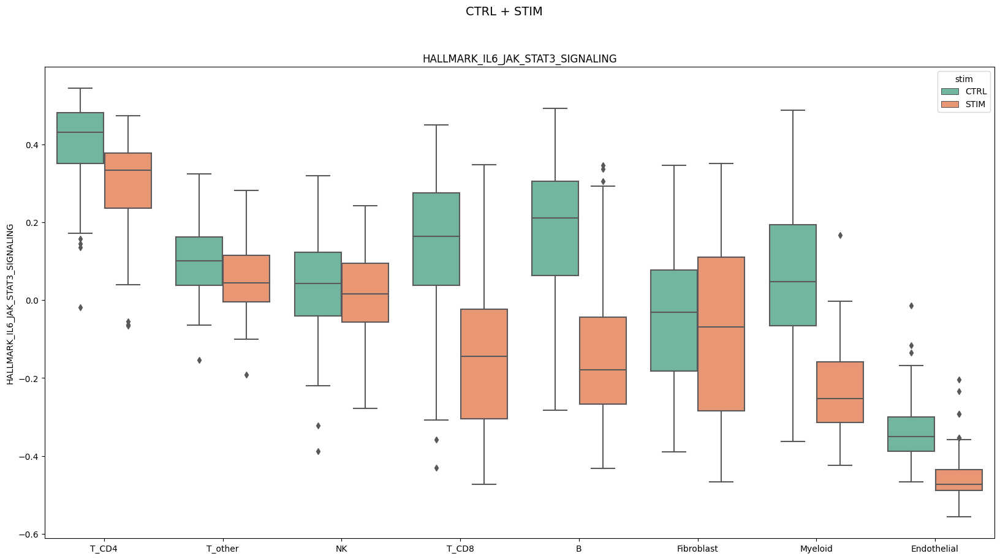

In [232]:

fig, axs = plt.subplots(1, 1,  figsize=(20,10))

sns.boxplot(data=gsva_adata, 
        x="Y_max", y=curr_pathway, hue="stim",
        ax= axs, order=meds.index.to_list())

axs.set(ylabel=curr_pathway)


axs.set_title(f"{curr_pathway}")
axs.set(xlabel=None)

fig.suptitle("CTRL + STIM", fontsize=14)
fig.show()


In [52]:
def test_gsva_wilcox(gsva_adata, curr_cell_type, curr_pathway):
    temp_test_df = gsva_adata.iloc[np.where(gsva_adata.Y_max == curr_cell_type)[0]]

    ctrl_idx = np.where(temp_test_df.stim == "CTRL")[0]
    stim_idx = np.where(temp_test_df.stim == "STIM")[0]

    len_test = np.min([len(ctrl_idx), len(stim_idx)])

    print(len_test)

    res = wilcoxon(temp_test_df[curr_pathway].iloc[ctrl_idx][0:len_test], temp_test_df[curr_pathway].iloc[stim_idx][0:len_test])

    return res

In [53]:
curr_pathway = "HALLMARK_IL6_JAK_STAT3_SIGNALING"
Fibroblast_test = test_gsva_wilcox(gsva_adata, "Fibroblast", curr_pathway)
Myeloid_test = test_gsva_wilcox(gsva_adata, "Myeloid", curr_pathway)
T_other_test = test_gsva_wilcox(gsva_adata, "T_other", curr_pathway)
Endothelial_test = test_gsva_wilcox(gsva_adata, "Endothelial", curr_pathway)

T_CD4_test = test_gsva_wilcox(gsva_adata, "T_CD4", curr_pathway)

B_test = test_gsva_wilcox(gsva_adata, "B", curr_pathway)

NK_test = test_gsva_wilcox(gsva_adata, "NK", curr_pathway)

T_CD8_test = test_gsva_wilcox(gsva_adata, "T_CD8", curr_pathway)


122
105
132
117
121
139
109
123


In [54]:
print(f"Fibroblast: {Fibroblast_test}")
print(f"Myeloid: {Myeloid_test}")
print(f"T_other: {T_other_test}")
print(f"Endothelial: {Endothelial_test}")
print(f"T_CD4: {T_CD4_test}")
print(f"B: {B_test}")
print(f"NK: {NK_test}")
print(f"T_CD8: {T_CD8_test}")

Fibroblast: WilcoxonResult(statistic=2861.0, pvalue=0.022892536301097045)
Myeloid: WilcoxonResult(statistic=330.0, pvalue=4.49914401310007e-15)
T_other: WilcoxonResult(statistic=3149.0, pvalue=0.004856785805082994)
Endothelial: WilcoxonResult(statistic=101.0, pvalue=8.035204090472776e-20)
T_CD4: WilcoxonResult(statistic=1106.0, pvalue=2.3080310648202436e-11)
B: WilcoxonResult(statistic=282.0, pvalue=5.652156200006528e-22)
NK: WilcoxonResult(statistic=1755.0, pvalue=0.00017238381343311337)
T_CD8: WilcoxonResult(statistic=634.0, pvalue=1.0245872478472142e-15)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2636982990.py:18: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


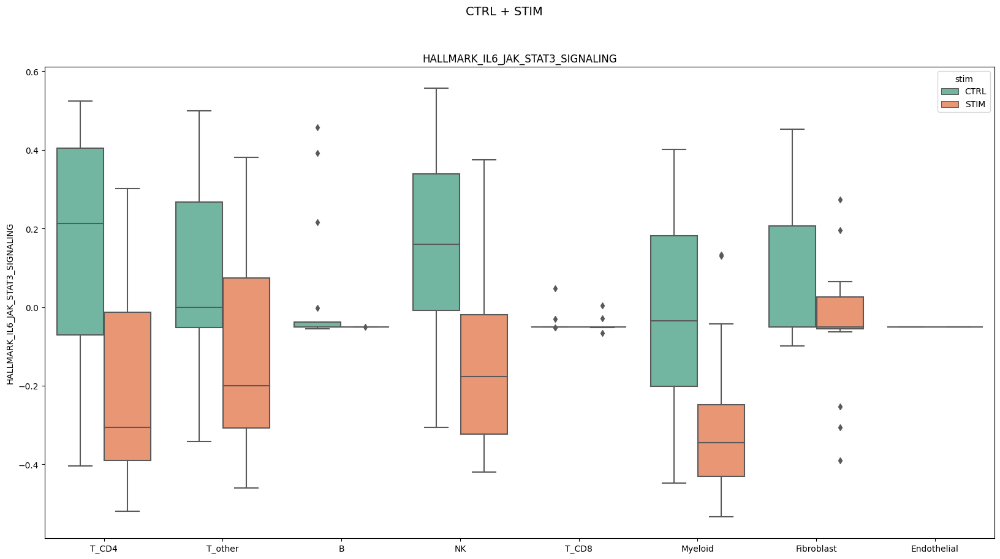

In [225]:
curr_pathway = "HALLMARK_IL6_JAK_STAT3_SIGNALING"
gsva_bp_adata = get_cell_score_all(gmt_path, bp_adata, bp_adata_df, kcdf="Poisson")


fig, axs = plt.subplots(1, 1,  figsize=(20,10))

sns.boxplot(data=gsva_bp_adata, 
        x="Y_max", y=curr_pathway, hue="stim",
        ax= axs, order=meds.index.to_list())

axs.set(ylabel=curr_pathway)


axs.set_title(f"{curr_pathway}")
axs.set(xlabel=None)

fig.suptitle("CTRL + STIM", fontsize=14)
fig.show()


In [210]:
curr_pathway = "HALLMARK_IL6_JAK_STAT3_SIGNALING"
Fibroblast_test = test_gsva_wilcox(gsva_bp_adata, "Fibroblast", curr_pathway)
Myeloid_test = test_gsva_wilcox(gsva_bp_adata, "Myeloid", curr_pathway)
T_other_test = test_gsva_wilcox(gsva_bp_adata, "T_other", curr_pathway)
Endothelial_test = test_gsva_wilcox(gsva_bp_adata, "Endothelial", curr_pathway)

T_CD4_test = test_gsva_wilcox(gsva_bp_adata, "T_CD4", curr_pathway)

B_test = test_gsva_wilcox(gsva_bp_adata, "B", curr_pathway)

NK_test = test_gsva_wilcox(gsva_bp_adata, "NK", curr_pathway)

T_CD8_test = test_gsva_wilcox(gsva_bp_adata, "T_CD8", curr_pathway)


16
16
16
16
16
16
16
16


In [211]:
print(f"Fibroblast: {Fibroblast_test}")
print(f"Myeloid: {Myeloid_test}")
print(f"T_other: {T_other_test}")
print(f"Endothelial: {Endothelial_test}")
print(f"T_CD4: {T_CD4_test}")
print(f"B: {B_test}")
print(f"NK: {NK_test}")
print(f"T_CD8: {T_CD8_test}")

Fibroblast: WilcoxonResult(statistic=59.0, pvalue=0.668548583984375)
Myeloid: WilcoxonResult(statistic=26.0, pvalue=0.02899169921875)
T_other: WilcoxonResult(statistic=37.0, pvalue=0.116668701171875)
Endothelial: WilcoxonResult(statistic=67.0, pvalue=0.979949951171875)
T_CD4: WilcoxonResult(statistic=12.0, pvalue=0.00213623046875)
B: WilcoxonResult(statistic=46.0, pvalue=0.274444580078125)
NK: WilcoxonResult(statistic=23.0, pvalue=0.01824951171875)
T_CD8: WilcoxonResult(statistic=56.0, pvalue=0.5618896484375)


# **Plot deconvolution estimates**


Here, we will plot the estimates of the bulks we used in training that were either labeled (CTRL samples) or unlabeled (STIM samples).

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-01-26 14:57:28.440970: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out/Softmax' id:943 op device:{requested: '', assigned: ''} def:{{{node cls_out/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](cls_out/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/327336181.py:35: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the fig

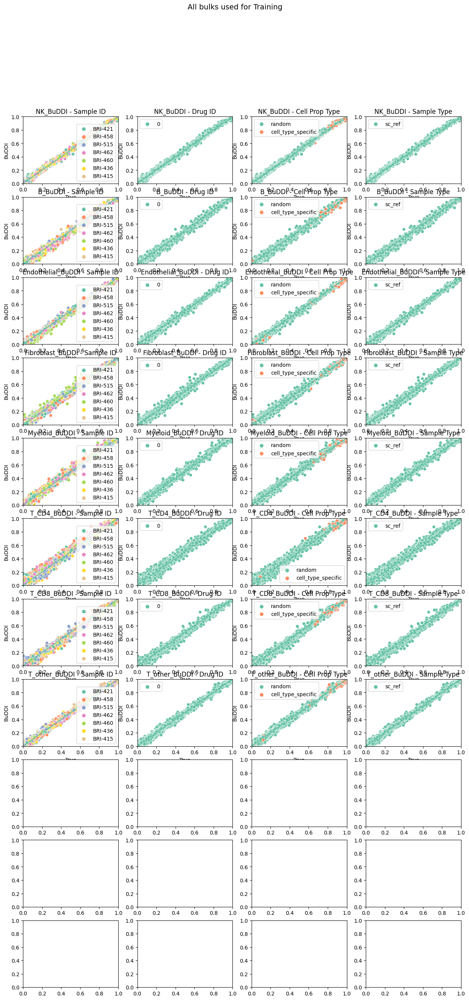

In [55]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.samp_type != "bulk"))[0]

idx_tmp = np.random.choice(idx_tmp, 10000, replace=True)


X_tmp = X_full[idx_tmp,]


# make predictions
prop_outputs = res1_classifier.predict(X_tmp, batch_size=500)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]



fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=label_temp[idx_tmp])
    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("All bulks used for Training", fontsize=14)

fig.show()



In [292]:
prop_outputs

array([[5.02145392e-09, 5.58050396e-03, 2.90794327e-04, 1.22859113e-01,
        8.03648531e-01, 6.76206350e-02, 7.04041714e-09, 3.67424718e-07],
       [2.47537246e-05, 6.88130975e-01, 2.01607227e-01, 3.36812669e-03,
        5.51119857e-02, 5.15511893e-02, 2.05795412e-04, 3.69393121e-08],
       [2.38347965e-07, 4.46836889e-01, 2.24168412e-02, 8.00535679e-02,
        4.47333634e-01, 3.34678753e-03, 1.20578725e-05, 4.17086143e-10],
       [1.02600245e-14, 4.05296773e-01, 6.55312715e-06, 5.89706123e-01,
        6.98219935e-07, 4.98984847e-03, 2.78166747e-12, 1.47265045e-09],
       [1.04216247e-10, 4.20541838e-02, 1.48294109e-03, 6.78859353e-01,
        2.77596563e-01, 6.95131985e-06, 1.24496520e-08, 1.93250289e-16],
       [3.39504244e-04, 2.32669368e-01, 5.80447949e-02, 1.10597782e-01,
        1.32735983e-01, 4.62523282e-01, 3.81731486e-04, 2.70750257e-03],
       [2.72597117e-05, 7.28933394e-01, 2.23859578e-01, 1.86328012e-02,
        1.55747207e-02, 3.62906954e-03, 9.34313331e-03, 8.

In [293]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,response,subject_id,pipeline_date,site,treatment,...,tissue_type,krenn_lining,krenn_inflammation,single_cell_tech,cell_count_to_10x,mRNA_run,protein_run,atac_run,qc,Y_max
0,BRI-462,CTRL,Train,random,sc_ref,Non.Responder,300-1930,8/22/19,UK London,1,...,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass,T_CD8
1,BRI-462,CTRL,Train,random,sc_ref,Non.Responder,300-1930,8/22/19,UK London,1,...,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass,T_CD4
2,BRI-462,CTRL,Train,random,sc_ref,Non.Responder,300-1930,8/22/19,UK London,1,...,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass,Fibroblast
3,BRI-462,CTRL,Train,random,sc_ref,Non.Responder,300-1930,8/22/19,UK London,1,...,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass,T_CD8
4,BRI-462,CTRL,Train,random,sc_ref,Non.Responder,300-1930,8/22/19,UK London,1,...,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass,Myeloid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40627,R4RAPAT00060,STIM,Train,realistic,bulk,Responder,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fibroblast
40628,R4RAPAT00066,CTRL,Train,realistic,bulk,Non.Responder,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NK
40629,R4RAPAT00066,STIM,Train,realistic,bulk,Non.Responder,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Myeloid
40630,R4RAPAT00072,CTRL,Train,realistic,bulk,Non.Responder,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Myeloid


In [503]:
## get with cibersort
cibersort_00_bulk = pd.read_csv(cibersort_00_bulk_path)


cibersort_00_bulk[['sample_id','time']] = cibersort_00_bulk['Mixture'].str.split('-',expand=True)

def get_stim_id(in_str):
    out_str = "STIM"
    if in_str == "week0":
        out_str = "CTRL"
           
    return(out_str)

cibersort_00_bulk['stim'] = [get_stim_id(str(x)) for x in cibersort_00_bulk["time"].tolist()]

col_interest = ["sample_id", "stim", "response"]
temp_meta_df = meta_df[col_interest]
cibersort_00_bulk = temp_meta_df.merge(cibersort_00_bulk, on=["sample_id", "stim"])
cibersort_00_bulk = cibersort_00_bulk.iloc[np.where(cibersort_00_bulk.stim == "CTRL")]


In [504]:
## get with cibersort
cibersort_01_bulk = pd.read_csv(cibersort_01_bulk_path)


cibersort_01_bulk[['sample_id','time']] = cibersort_01_bulk['Mixture'].str.split('-',expand=True)

def get_stim_id(in_str):
    out_str = "STIM"
    if in_str == "week0":
        out_str = "CTRL"
           
    return(out_str)

cibersort_01_bulk['stim'] = [get_stim_id(str(x)) for x in cibersort_01_bulk["time"].tolist()]

col_interest = ["sample_id", "stim", "response"]
temp_meta_df = meta_df[col_interest]
cibersort_01_bulk = temp_meta_df.merge(cibersort_01_bulk, on=["sample_id", "stim"])
cibersort_01_bulk = cibersort_01_bulk.iloc[np.where(cibersort_01_bulk.stim == "STIM")]


In [505]:
## get with cibersort
cibersort_bulk = pd.read_csv(cibersort_bulk_path)

cibersort_bulk[['sample_id','time']] = cibersort_bulk['Mixture'].str.split('-',expand=True)

def get_stim_id(in_str):
    out_str = "STIM"
    if in_str == "week0":
        out_str = "CTRL"
           
    return(out_str)

cibersort_bulk['stim'] = [get_stim_id(str(x)) for x in cibersort_bulk["time"].tolist()]

col_interest = ["sample_id", "stim", "response"]
temp_meta_df = meta_df[col_interest]
cibersort_bulk = temp_meta_df.merge(cibersort_bulk, on=["sample_id", "stim"])



In [506]:
ciber_buddi = cibersort_01_bulk.append(cibersort_00_bulk)
ciber_buddi

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/396520851.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ciber_buddi = cibersort_01_bulk.append(cibersort_00_bulk)


,sample_id,stim,response,Mixture,T_other,NK,Fibroblast,T_CD4,B,Endothelial,Myeloid,T_CD8,P-value,Correlation,RMSE,time
1,R4RAPAT00099,STIM,Non.Responder,R4RAPAT00099-week16,0.000000,0.000000,0.000000,0.000000,0.528989,0.097395,0.373616,0.000000,0,0.666419,0.842284,week16
3,R4RAPAT00107,STIM,Non.Responder,R4RAPAT00107-week16,0.037139,0.000000,0.291805,0.000000,0.619188,0.051868,0.000000,0.000000,0,0.409801,0.935596,week16
5,R4RAPAT00110,STIM,Responder,R4RAPAT00110-week16,0.000000,0.028000,0.000000,0.147097,0.165245,0.110017,0.549642,0.000000,0,0.635388,0.837070,week16
7,R4RAPAT00114,STIM,Non.Responder,R4RAPAT00114-week16,0.000000,0.024151,0.812729,0.000000,0.000000,0.086788,0.076333,0.000000,0,0.856273,0.578568,week16
9,R4RAPAT00117,STIM,Non.Responder,R4RAPAT00117-week16,0.000000,0.010091,0.094560,0.000000,0.199914,0.018846,0.676588,0.000000,0,0.659147,0.814259,week16
11,R4RAPAT00118,STIM,Non.Responder,R4RAPAT00118-week16,0.006138,0.000000,0.000000,0.000000,0.200535,0.178887,0.614440,0.000000,0,0.724460,0.780183,week16
13,R4RAPAT00129,STIM,Responder,R4RAPAT00129-week16,0.000000,0.000000,0.000000,0.110159,0.000000,0.000000,0.889841,0.000000,0,0.543487,0.865399,week16
15,R4RAPAT00140,STIM,Responder,R4RAPAT00140-week16,0.013585,0.000000,0.000000,0.016114,0.000000,0.970301,0.000000,0.000000,0,0.861155,0.541811,week16
17,R4RAPAT00142,STIM,Non.Responder,R4RAPAT00142-week16,0.000000,0.000000,0.000000,0.000000,0.374583,0.166763,0.389216,0.069438,0,0.582997,0.861741,week16
19,R4RAPAT00145,STIM,Non.Responder,R4RAPAT00145-week16,0.000000,0.000000,0.000000,0.451833,0.192536,0.056042,0.299588,0.000000,0,0.264487,0.999084,week16


In [507]:
## get with bayesprism
bp_bulk = pd.read_csv(bp_bulk_path, delimiter="\t")


def get_stim_id(in_str):
    out_str = "STIM"
    if in_str == "week0":
        out_str = "CTRL"
           
    return(out_str)

bp_bulk['stim'] = [get_stim_id(str(x)) for x in bp_bulk["time"].tolist()]

col_interest = ["sample_id", "stim", "response"]
temp_meta_df = meta_df[col_interest]
bp_bulk = temp_meta_df.merge(bp_bulk, on=["sample_id", "stim"])



In [508]:
## get with bayesprism
bp_00_bulk = pd.read_csv(bp_00_bulk_path, delimiter="\t")


def get_stim_id(in_str):
    out_str = "STIM"
    if in_str == "week0":
        out_str = "CTRL"
           
    return(out_str)

bp_00_bulk['stim'] = [get_stim_id(str(x)) for x in bp_00_bulk["time"].tolist()]

col_interest = ["sample_id", "stim", "response"]
temp_meta_df = meta_df[col_interest]
bp_00_bulk = temp_meta_df.merge(bp_00_bulk, on=["sample_id", "stim"])

bp_00_bulk = bp_00_bulk.iloc[np.where(bp_00_bulk.stim == "CTRL")]


In [509]:
## get with bayesprism
bp_01_bulk = pd.read_csv(bp_01_bulk_path, delimiter="\t")

def get_stim_id(in_str):
    out_str = "STIM"
    if in_str == "week0":
        out_str = "CTRL"
           
    return(out_str)

bp_01_bulk['stim'] = [get_stim_id(str(x)) for x in bp_01_bulk["time"].tolist()]

col_interest = ["sample_id", "stim", "response"]
temp_meta_df = meta_df[col_interest]
bp_01_bulk = temp_meta_df.merge(bp_01_bulk, on=["sample_id", "stim"])

bp_01_bulk = bp_01_bulk.iloc[np.where(bp_01_bulk.stim == "STIM")]


In [510]:
bp_buddi = bp_01_bulk.append(bp_00_bulk)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/4192352565.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  bp_buddi = bp_01_bulk.append(bp_00_bulk)


In [511]:
bp_buddi

,sample_id,stim,response,T_other,NK,Fibroblast,T_CD4,B,Endothelial,Myeloid,T_CD8,time
1,R4RAPAT00099,STIM,Non.Responder,6.916007e-07,2.515513e-04,4.772109e-07,8.316478e-07,1.818389e-02,1.329126e-03,9.684346e-01,1.179887e-02,week16
3,R4RAPAT00107,STIM,Non.Responder,2.587970e-03,1.408574e-06,3.066754e-01,3.393769e-06,5.310518e-01,8.503887e-07,1.596781e-01,1.111558e-06,week16
5,R4RAPAT00110,STIM,Responder,3.932107e-06,8.908620e-05,1.200303e-06,1.306986e-01,1.545459e-06,1.684575e-06,8.213681e-01,4.783585e-02,week16
7,R4RAPAT00114,STIM,Non.Responder,3.386756e-06,3.683741e-06,2.718828e-01,1.471754e-06,5.385921e-07,2.285544e-02,7.052275e-01,2.515424e-05,week16
9,R4RAPAT00117,STIM,Non.Responder,3.126754e-07,1.445695e-06,4.566639e-07,4.177771e-07,5.999743e-07,1.263252e-06,9.999939e-01,1.621107e-06,week16
11,R4RAPAT00118,STIM,Non.Responder,3.773436e-07,1.637687e-06,1.260744e-06,3.945873e-07,5.039057e-03,1.478812e-01,8.470745e-01,1.550535e-06,week16
13,R4RAPAT00129,STIM,Responder,1.050972e-06,6.479206e-04,1.342501e-06,1.428561e-01,2.640324e-06,1.585455e-06,8.562726e-01,2.167474e-04,week16
15,R4RAPAT00140,STIM,Responder,5.256902e-07,9.697429e-07,8.233110e-07,3.246215e-07,9.216115e-07,6.172959e-01,3.826999e-01,7.110392e-07,week16
17,R4RAPAT00142,STIM,Non.Responder,2.644834e-06,2.516285e-06,5.505742e-07,2.230386e-06,5.228343e-06,5.247894e-06,8.919947e-01,1.079869e-01,week16
19,R4RAPAT00145,STIM,Non.Responder,4.557056e-07,1.780888e-06,9.215848e-07,5.462024e-01,7.930674e-03,1.453641e-06,4.458600e-01,2.267111e-06,week16


In [512]:
ciber_buddi

,sample_id,stim,response,Mixture,T_other,NK,Fibroblast,T_CD4,B,Endothelial,Myeloid,T_CD8,P-value,Correlation,RMSE,time
1,R4RAPAT00099,STIM,Non.Responder,R4RAPAT00099-week16,0.000000,0.000000,0.000000,0.000000,0.528989,0.097395,0.373616,0.000000,0,0.666419,0.842284,week16
3,R4RAPAT00107,STIM,Non.Responder,R4RAPAT00107-week16,0.037139,0.000000,0.291805,0.000000,0.619188,0.051868,0.000000,0.000000,0,0.409801,0.935596,week16
5,R4RAPAT00110,STIM,Responder,R4RAPAT00110-week16,0.000000,0.028000,0.000000,0.147097,0.165245,0.110017,0.549642,0.000000,0,0.635388,0.837070,week16
7,R4RAPAT00114,STIM,Non.Responder,R4RAPAT00114-week16,0.000000,0.024151,0.812729,0.000000,0.000000,0.086788,0.076333,0.000000,0,0.856273,0.578568,week16
9,R4RAPAT00117,STIM,Non.Responder,R4RAPAT00117-week16,0.000000,0.010091,0.094560,0.000000,0.199914,0.018846,0.676588,0.000000,0,0.659147,0.814259,week16
11,R4RAPAT00118,STIM,Non.Responder,R4RAPAT00118-week16,0.006138,0.000000,0.000000,0.000000,0.200535,0.178887,0.614440,0.000000,0,0.724460,0.780183,week16
13,R4RAPAT00129,STIM,Responder,R4RAPAT00129-week16,0.000000,0.000000,0.000000,0.110159,0.000000,0.000000,0.889841,0.000000,0,0.543487,0.865399,week16
15,R4RAPAT00140,STIM,Responder,R4RAPAT00140-week16,0.013585,0.000000,0.000000,0.016114,0.000000,0.970301,0.000000,0.000000,0,0.861155,0.541811,week16
17,R4RAPAT00142,STIM,Non.Responder,R4RAPAT00142-week16,0.000000,0.000000,0.000000,0.000000,0.374583,0.166763,0.389216,0.069438,0,0.582997,0.861741,week16
19,R4RAPAT00145,STIM,Non.Responder,R4RAPAT00145-week16,0.000000,0.000000,0.000000,0.451833,0.192536,0.056042,0.299588,0.000000,0,0.264487,0.999084,week16


In [513]:
# now lets compare the cell proportions before and after
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.samp_type == "bulk"))[0]
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = res1_classifier.predict(X_tmp, batch_size=500)

# compare before and after
temp_meta_df = meta_df.iloc[idx_tmp]


# get b cell proportions
b_index = np.where(Y_full.columns == 'B')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"B"] = b_prop

b_index = np.where(Y_full.columns == 'T_CD8')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"T_CD8"] = b_prop


b_index = np.where(Y_full.columns == 'T_CD4')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"T_CD4"] = b_prop


b_index = np.where(Y_full.columns == 'T_other')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"T_other"] = b_prop


b_index = np.where(Y_full.columns == 'NK')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"NK"] = b_prop


b_index = np.where(Y_full.columns == 'T_CD8')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"T_CD8"] = b_prop

b_index = np.where(Y_full.columns == 'Myeloid')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"Myeloid"] = b_prop


b_index = np.where(Y_full.columns == 'Endothelial')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"Endothelial"] = b_prop



b_index = np.where(Y_full.columns == 'Fibroblast')[0]
b_prop = prop_outputs[:,b_index]
b_prop = b_prop.flatten()
temp_meta_df.loc[:,"Fibroblast"] = b_prop

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2107183023.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.loc[:,"B"] = b_prop
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2107183023.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.loc[:,"T_CD8"] = b_prop
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2107183023.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

In [514]:
# join together
cibersort_bulk["method"] = "cibersort"
ciber_buddi["method"] = "ciber_buddi"
temp_meta_df["method"] = "buddi"
buddi_bulk = temp_meta_df.copy()
bp_bulk["method"] = "bp"
bp_buddi["method"] = "bp_buddi"

shared_col = ["method", "sample_id", "stim", "response", "NK","B", "Endothelial", "Fibroblast", "Myeloid", "T_CD8", "T_CD4", "T_other"]
temp_meta_df = temp_meta_df[shared_col]
temp_meta_df = temp_meta_df.append(cibersort_bulk[shared_col])
temp_meta_df = temp_meta_df.append(ciber_buddi[shared_col])
temp_meta_df = temp_meta_df.append(bp_bulk[shared_col])
temp_meta_df = temp_meta_df.append(bp_buddi[shared_col])
temp_meta_df

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3410749682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df["method"] = "buddi"
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3410749682.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_meta_df = temp_meta_df.append(cibersort_bulk[shared_col])
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3410749682.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_meta_df = temp_meta_df.append(ciber_buddi[shared_col])
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1

,method,sample_id,stim,response,NK,B,Endothelial,Fibroblast,Myeloid,T_CD8,T_CD4,T_other
40600,buddi,R4RAPAT00099,CTRL,Non.Responder,5.021454e-09,5.580504e-03,2.907943e-04,1.228591e-01,8.036485e-01,7.040417e-09,0.067621,3.674247e-07
40601,buddi,R4RAPAT00099,STIM,Non.Responder,2.475372e-05,6.881310e-01,2.016072e-01,3.368127e-03,5.511199e-02,2.057954e-04,0.051551,3.693931e-08
40602,buddi,R4RAPAT00107,CTRL,Non.Responder,2.383480e-07,4.468369e-01,2.241684e-02,8.005357e-02,4.473336e-01,1.205787e-05,0.003347,4.170861e-10
40603,buddi,R4RAPAT00107,STIM,Non.Responder,1.026002e-14,4.052968e-01,6.553127e-06,5.897061e-01,6.982199e-07,2.781667e-12,0.004990,1.472650e-09
40604,buddi,R4RAPAT00110,CTRL,Responder,1.042162e-10,4.205418e-02,1.482941e-03,6.788594e-01,2.775966e-01,1.244965e-08,0.000007,1.932503e-16
...,...,...,...,...,...,...,...,...,...,...,...,...
22,bp_buddi,R4RAPAT00047,CTRL,Responder,1.144312e-04,1.135312e-02,1.401267e-02,1.560696e-06,1.100028e-03,6.006614e-06,0.973412,6.021453e-07
24,bp_buddi,R4RAPAT00056,CTRL,Non.Responder,2.471392e-07,1.567479e-07,1.759933e-07,2.859145e-07,2.260980e-07,3.615214e-07,0.674207,3.257917e-01
26,bp_buddi,R4RAPAT00060,CTRL,Responder,9.442852e-06,1.550373e-06,3.232916e-06,9.999000e-01,9.058838e-06,2.708470e-06,0.000002,7.193439e-05
28,bp_buddi,R4RAPAT00066,CTRL,Non.Responder,6.823307e-07,4.001757e-07,5.578240e-07,7.218741e-03,8.602681e-07,2.937732e-06,0.202958,7.898177e-01


In [515]:
temp_test_df = temp_meta_df.iloc[np.where(np.logical_and(temp_meta_df.method == "buddi", temp_meta_df.stim == "STIM"))[0]]

ttest_ind(temp_test_df.B.iloc[np.where(temp_test_df.response == "Responder")[0]], temp_test_df.B.iloc[np.where(temp_test_df.response == "Non.Responder")[0]])

Ttest_indResult(statistic=-0.8076792974651129, pvalue=0.4327847402382874)

In [617]:
def plot_cell_diff(fig, axs, temp_meta_df, curr_cell_type):

    hue_order = temp_meta_df.stim.unique()

    sns.boxplot(data=temp_meta_df, 
                x="stim", y=curr_cell_type,
                hue="method", ax= axs[0,0])
    axs[0,0].set_title(f"{curr_cell_type} proportion differences\n between CTRL and STIM")
    axs[0,0].set(ylabel=f"{curr_cell_type} prop")
    axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=45, horizontalalignment='right')


    sns.boxplot(data=temp_meta_df.iloc[np.where(temp_meta_df.method == "bp_buddi")[0]], 
                x="response", y=curr_cell_type,
                hue="stim", ax= axs[0,1], hue_order=hue_order)
    axs[0,1].set_title(f"{curr_cell_type} BP_buddi proportion differences\n between CTRL and STIM")
    axs[0,1].set(ylabel=f"{curr_cell_type} BP_buddi prop")
    axs[0,1].set_xticklabels(axs[0,1].get_xticklabels(), rotation=45, horizontalalignment='right')


    sns.boxplot(data=temp_meta_df.iloc[np.where(temp_meta_df.method == "ciber_buddi")[0]], 
                x="response", y=curr_cell_type,
                hue="stim", ax= axs[0,2], hue_order=hue_order)
    axs[0,2].set_title(f"{curr_cell_type} ciber_buddi proportion differences\n between CTRL and STIM")
    axs[0,2].set(ylabel=f"{curr_cell_type} ciber_buddi prop")
    axs[0,2].set_xticklabels(axs[0,2].get_xticklabels(), rotation=45, horizontalalignment='right')


    sns.boxplot(data=temp_meta_df.iloc[np.where(temp_meta_df.method == "buddi")[0]], 
                x="response", y=curr_cell_type,
                hue="stim", ax= axs[1,0], hue_order=hue_order)
    axs[1,0].set_title(f"{curr_cell_type} buddi proportion differences\n between CTRL and STIM")
    axs[1,0].set(ylabel=f"{curr_cell_type} buddi prop")
    axs[1,0].set_xticklabels(axs[1,0].get_xticklabels(), rotation=45, horizontalalignment='right')

    sns.boxplot(data=temp_meta_df.iloc[np.where(temp_meta_df.method == "cibersort")[0]], 
                x="response", y=curr_cell_type,
                hue="stim", ax= axs[1,1], hue_order=hue_order)
    axs[1,1].set_title(f"{curr_cell_type} CIBERSORTx proportion differences\n between CTRL and STIM")
    axs[1,1].set(ylabel=f"{curr_cell_type} CIBERSORTx prop")
    axs[1,1].set_xticklabels(axs[1,1].get_xticklabels(), rotation=45, horizontalalignment='right')

    sns.boxplot(data=temp_meta_df.iloc[np.where(temp_meta_df.method == "bp")[0]], 
                x="response", y=curr_cell_type,
                hue="stim", ax= axs[1,2], hue_order=hue_order)
    axs[1,2].set_title(f"{curr_cell_type} BayesPrism proportion differences\n between CTRL and STIM")
    axs[1,2].set(ylabel=f"{curr_cell_type} BayesPrism prop")
    axs[1,2].set_xticklabels(axs[1,2].get_xticklabels(), rotation=45, horizontalalignment='right')


    fig.suptitle(f"{curr_cell_type}  prop in CTRL + STIM", fontsize=14)
    fig.tight_layout()

    return fig, axs

In [618]:
temp_meta_df[["method", "response", "stim", "sample_id"]]

,method,response,stim,sample_id
40600,buddi,Non.Responder,CTRL,R4RAPAT00099
40601,buddi,Non.Responder,STIM,R4RAPAT00099
40602,buddi,Non.Responder,CTRL,R4RAPAT00107
40603,buddi,Non.Responder,STIM,R4RAPAT00107
40604,buddi,Responder,CTRL,R4RAPAT00110
...,...,...,...,...
22,bp_buddi,Responder,CTRL,R4RAPAT00047
24,bp_buddi,Non.Responder,CTRL,R4RAPAT00056
26,bp_buddi,Responder,CTRL,R4RAPAT00060
28,bp_buddi,Non.Responder,CTRL,R4RAPAT00066


In [619]:

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]
temp_meta_scaled_df = sp.stats.zscore(temp_meta_df[cell_type_list], axis=1)
temp_meta_scaled_df = pd.concat([temp_meta_df[["method", "response", "stim", "sample_id"]], temp_meta_scaled_df], axis=1)

temp_meta_scaled_df

,method,response,stim,sample_id,NK,B,Myeloid,T_CD4,T_CD8,T_other,Endothelial,Fibroblast
40600,buddi,Non.Responder,CTRL,R4RAPAT00099,-0.480881,-0.459412,2.610792,-0.220741,-0.480881,-0.480879,-0.479762,-0.008236
40601,buddi,Non.Responder,STIM,R4RAPAT00099,-0.562521,2.534685,-0.314570,-0.330597,-0.561706,-0.562632,0.344814,-0.547472
40602,buddi,Non.Responder,CTRL,R4RAPAT00107,-0.666141,1.715114,1.717761,-0.648307,-0.666078,-0.666142,-0.546680,-0.239526
40603,buddi,Non.Responder,STIM,R4RAPAT00107,-0.568297,1.274333,-0.568293,-0.545611,-0.568297,-0.568297,-0.568267,2.112727
40604,buddi,Responder,CTRL,R4RAPAT00110,-0.549033,-0.364320,0.670244,-0.549002,-0.549033,-0.549033,-0.542519,2.432695
...,...,...,...,...,...,...,...,...,...,...,...,...
22,bp_buddi,Responder,CTRL,R4RAPAT00047,-0.389399,-0.354357,-0.386326,2.645389,-0.389737,-0.389754,-0.346064,-0.389751
24,bp_buddi,Non.Responder,CTRL,R4RAPAT00056,-0.535627,-0.535628,-0.535628,2.353367,-0.535627,0.860398,-0.535628,-0.535627
26,bp_buddi,Responder,CTRL,R4RAPAT00060,-0.377979,-0.378003,-0.377980,-0.378001,-0.377999,-0.377790,-0.377998,2.645751
28,bp_buddi,Non.Responder,CTRL,R4RAPAT00066,-0.481098,-0.481099,-0.481097,0.300045,-0.481089,2.558752,-0.481098,-0.453317


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/866960455.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


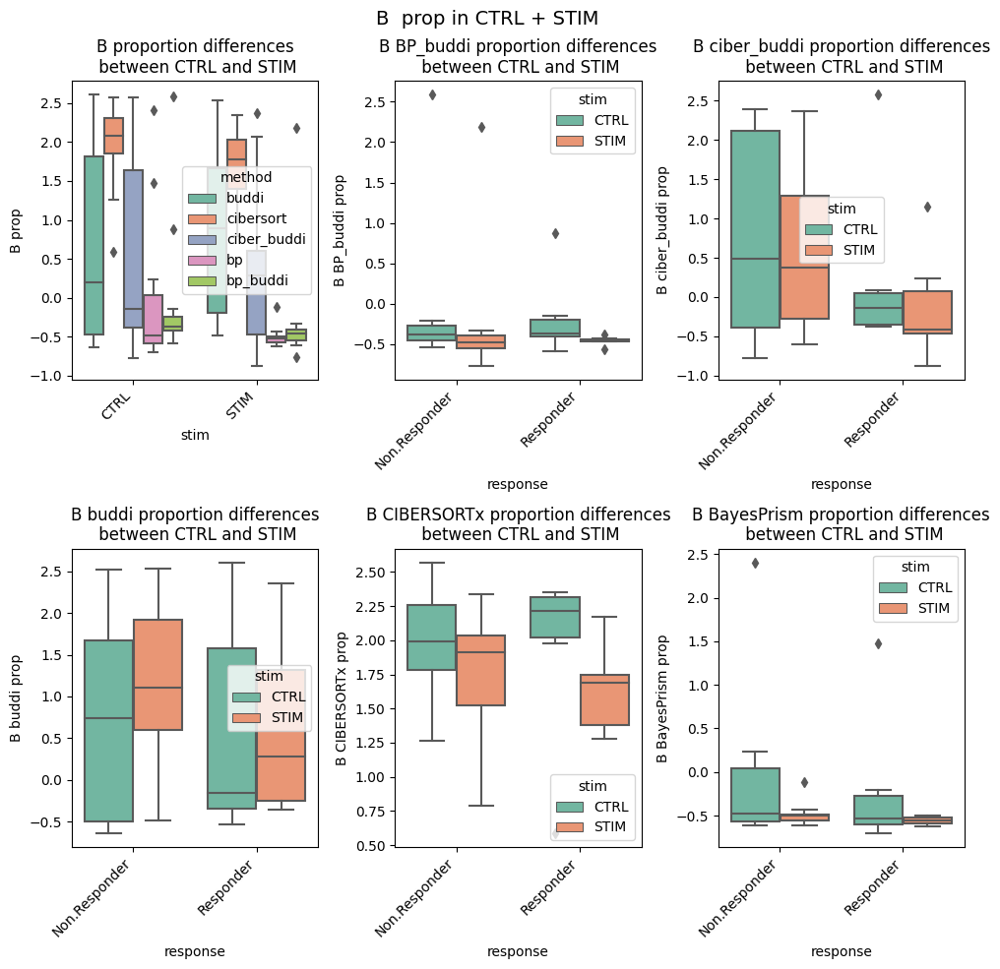

In [620]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "B")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3658128016.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


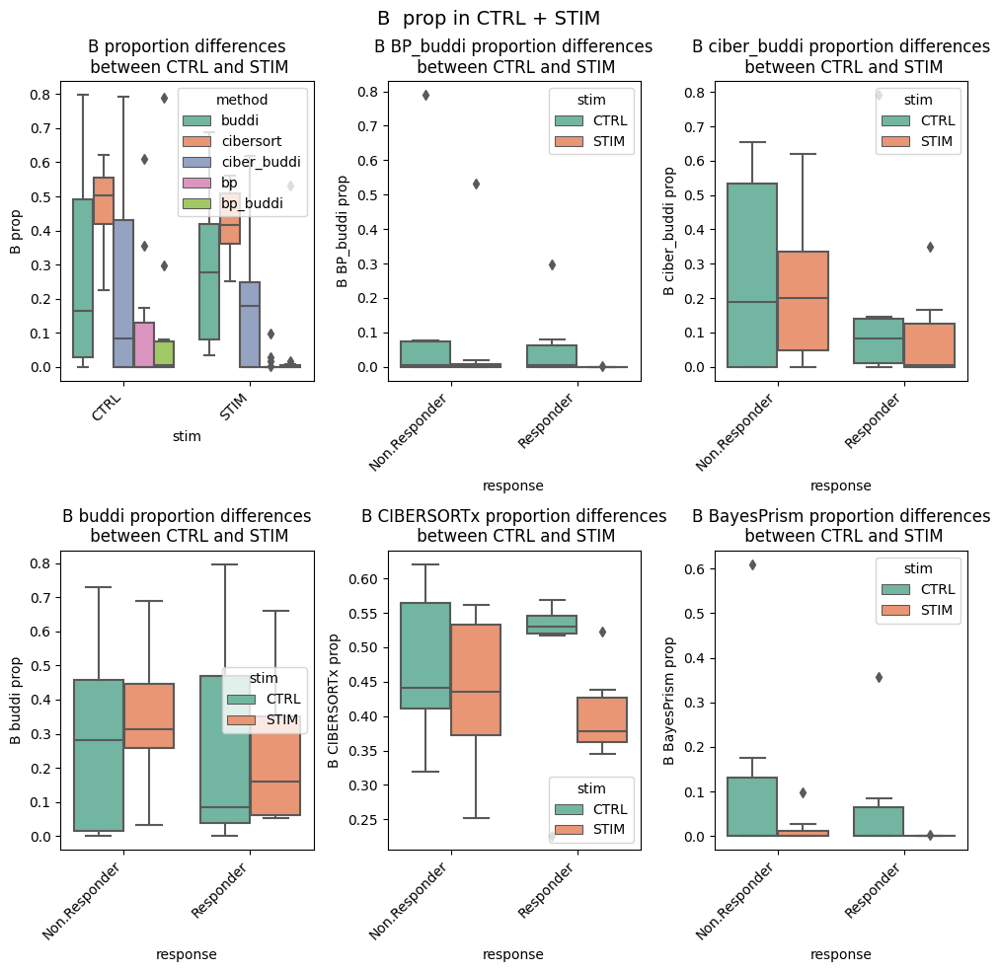

In [621]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "B")

fig.show()

In [622]:
import scipy

temp_test_df = temp_meta_df.iloc[np.where(np.logical_and(temp_meta_df.method == "bp_buddi", temp_meta_df.response == "Responder"))[0]]

scipy.stats.wilcoxon(temp_test_df.B.iloc[np.where(temp_test_df.stim == "CTRL")[0]], temp_test_df.B.iloc[np.where(temp_test_df.stim == "STIM")[0]])

WilcoxonResult(statistic=3.0, pvalue=0.15625)

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/1309153287.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


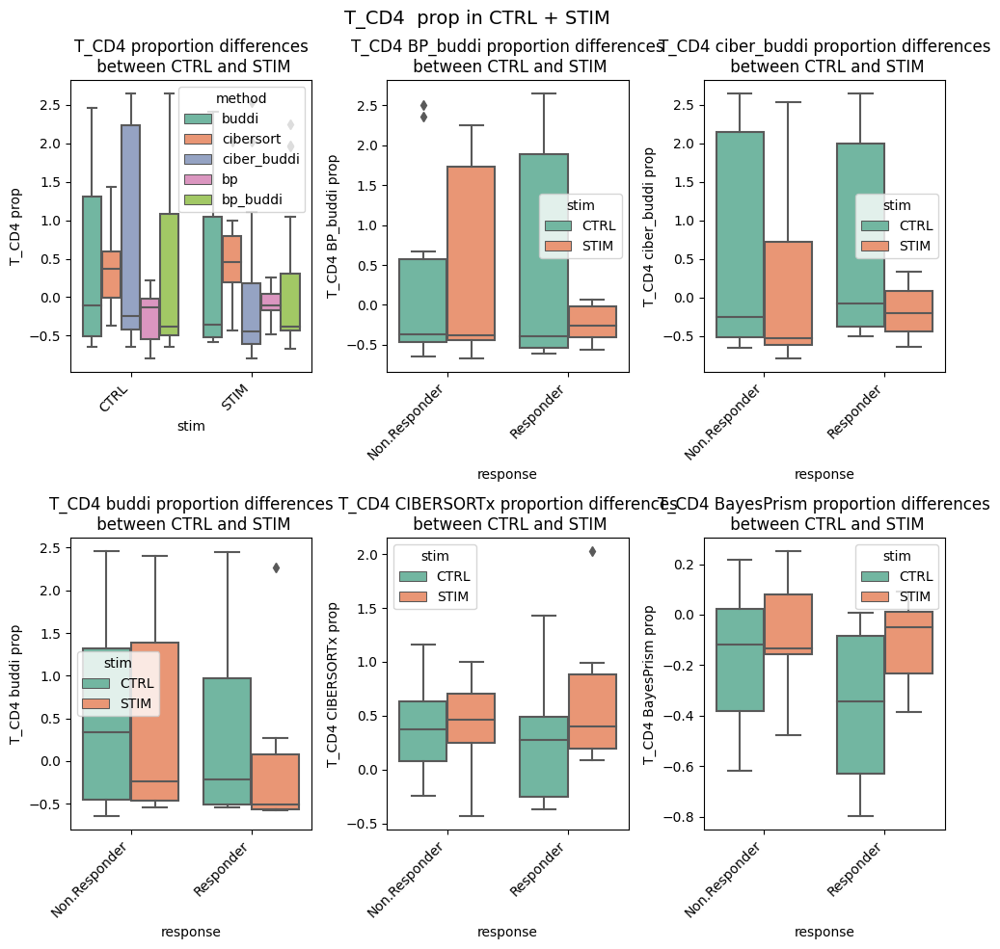

In [623]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "T_CD4")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2717372805.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


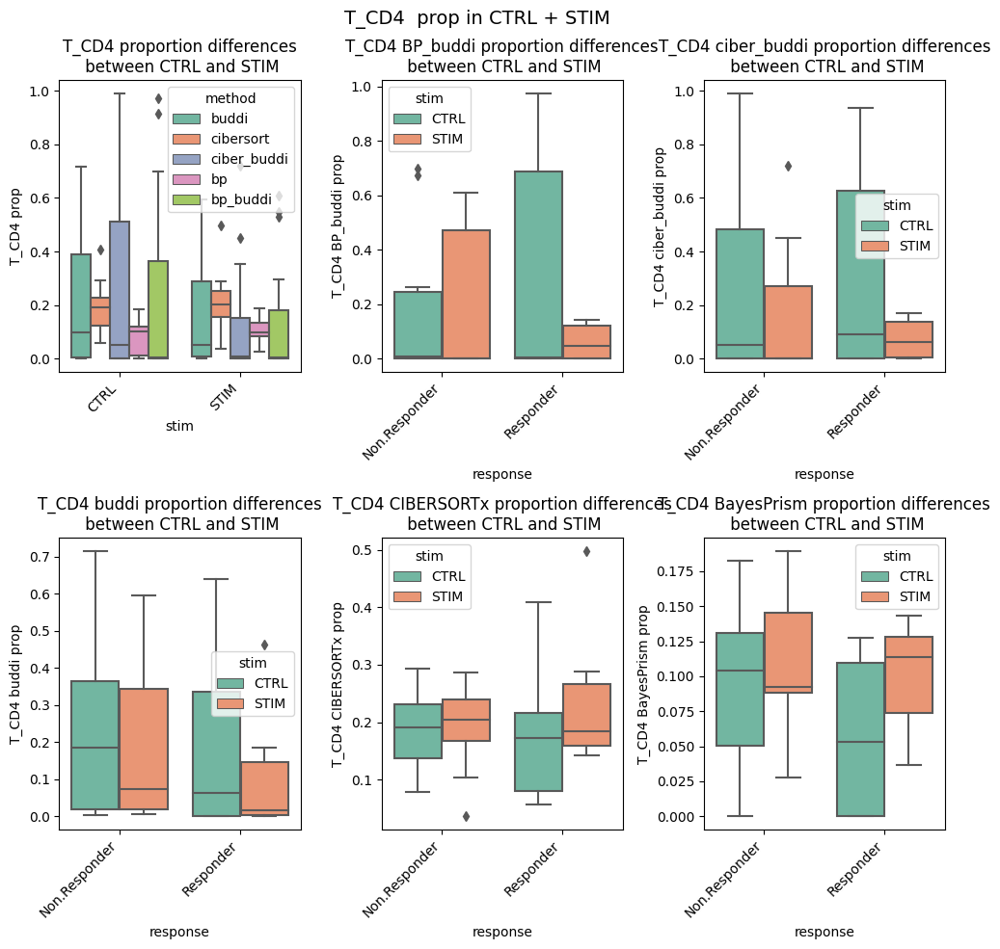

In [624]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "T_CD4")

fig.show()

In [625]:
import scipy

temp_test_df = temp_meta_df.iloc[np.where(np.logical_and(temp_meta_df.method == "buddi", temp_meta_df.response == "Responder"))[0]]

scipy.stats.wilcoxon(temp_test_df.T_CD8.iloc[np.where(temp_test_df.stim == "CTRL")[0]], temp_test_df.T_CD8.iloc[np.where(temp_test_df.stim == "STIM")[0]])

WilcoxonResult(statistic=4.0, pvalue=0.21875)

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3489189370.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


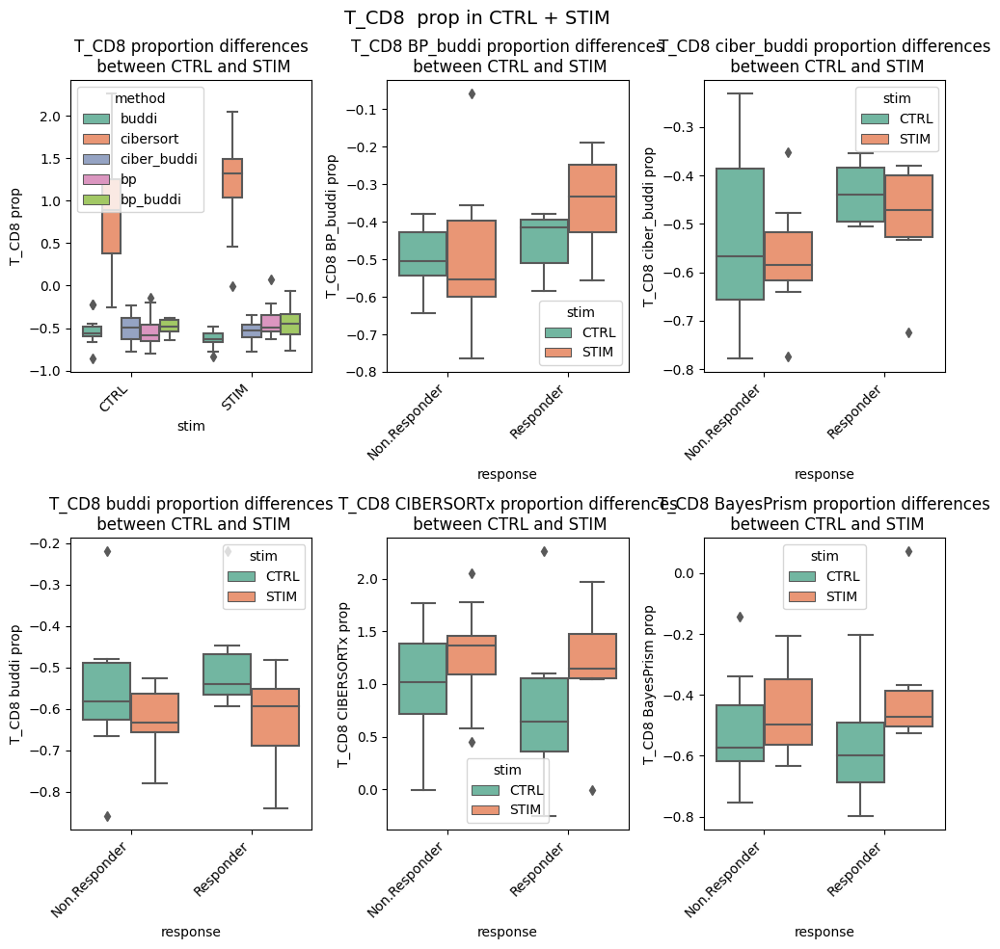

In [626]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "T_CD8")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/278585074.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


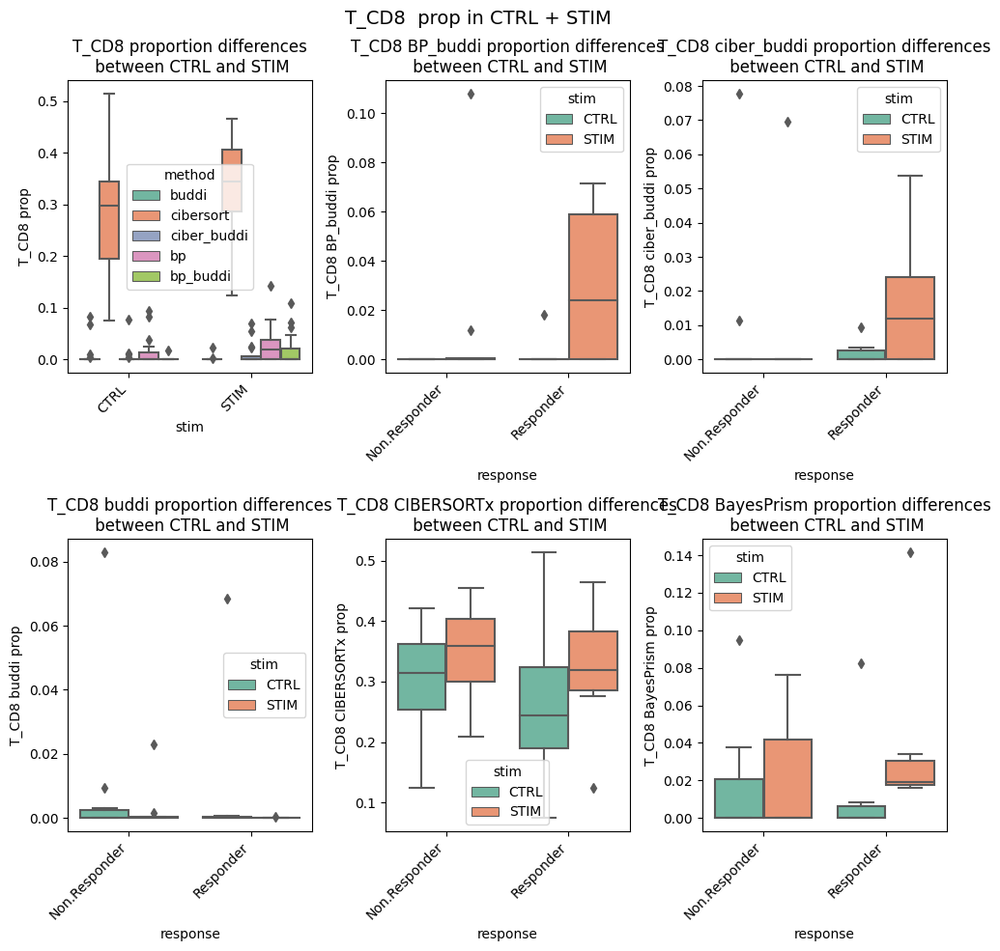

In [627]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "T_CD8")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/563990716.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


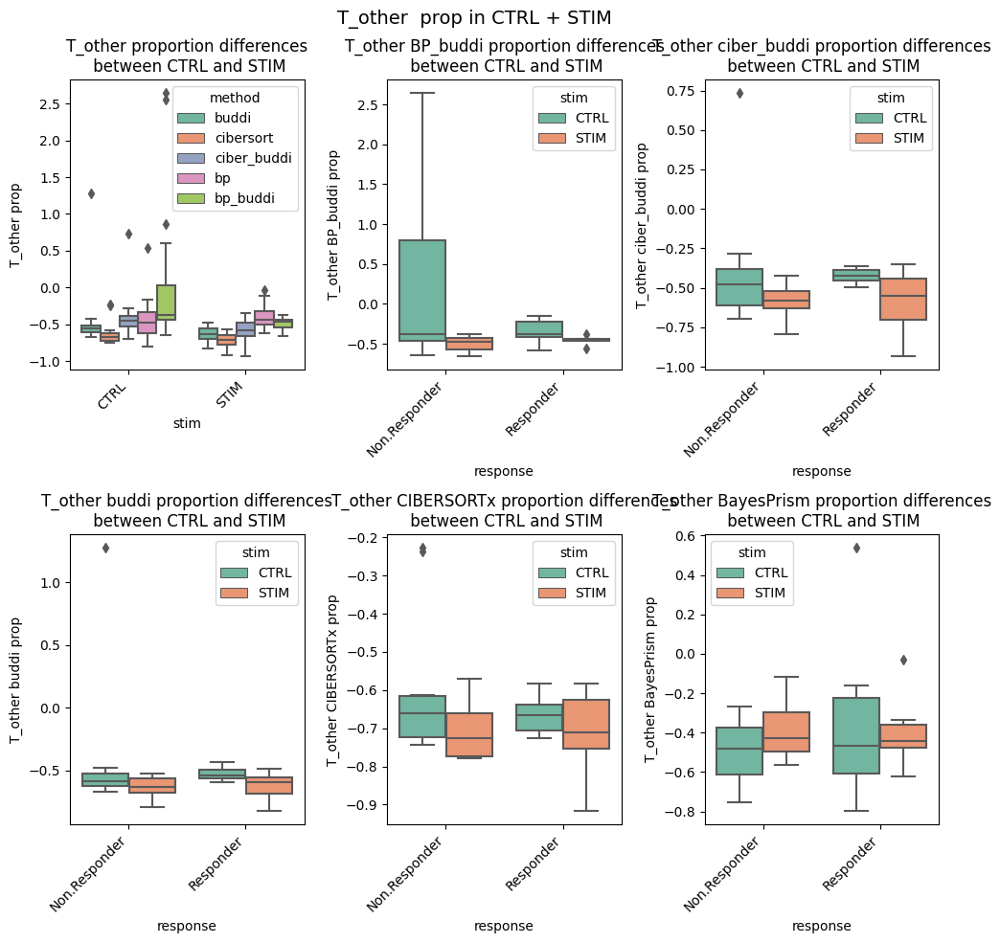

In [628]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "T_other")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/4294937031.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


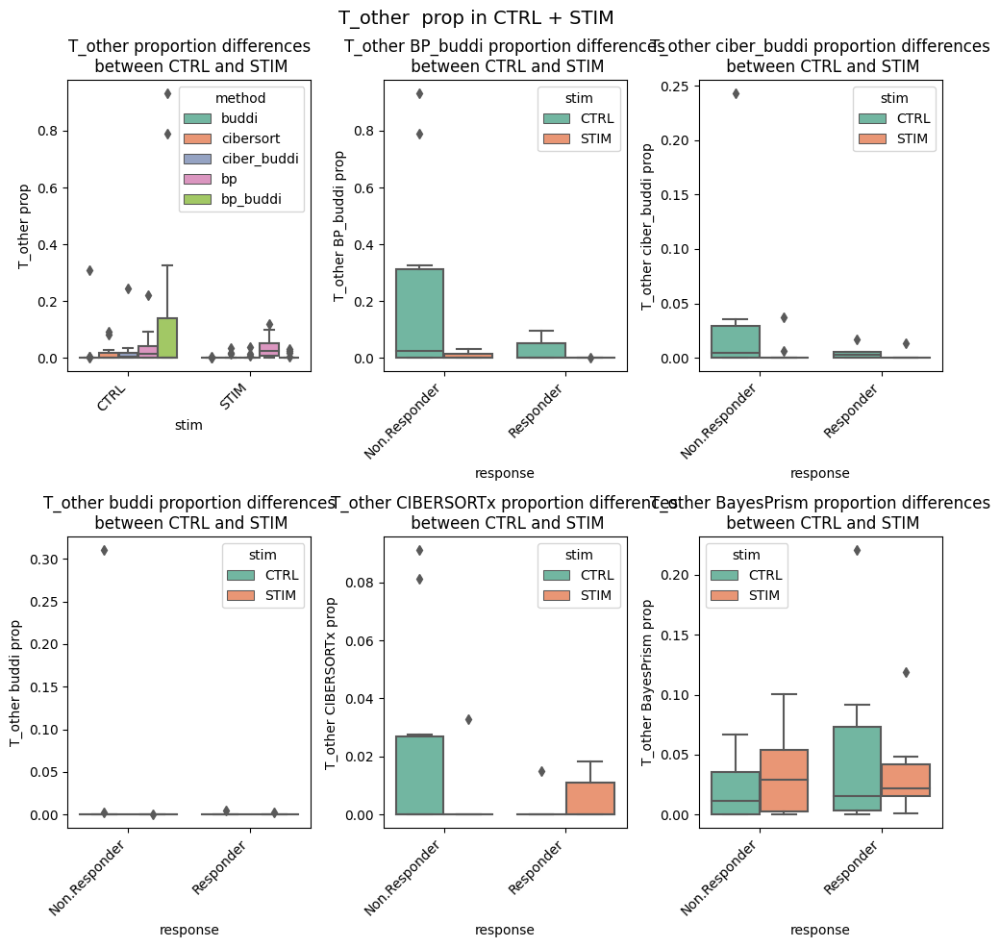

In [629]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "T_other")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/513201354.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


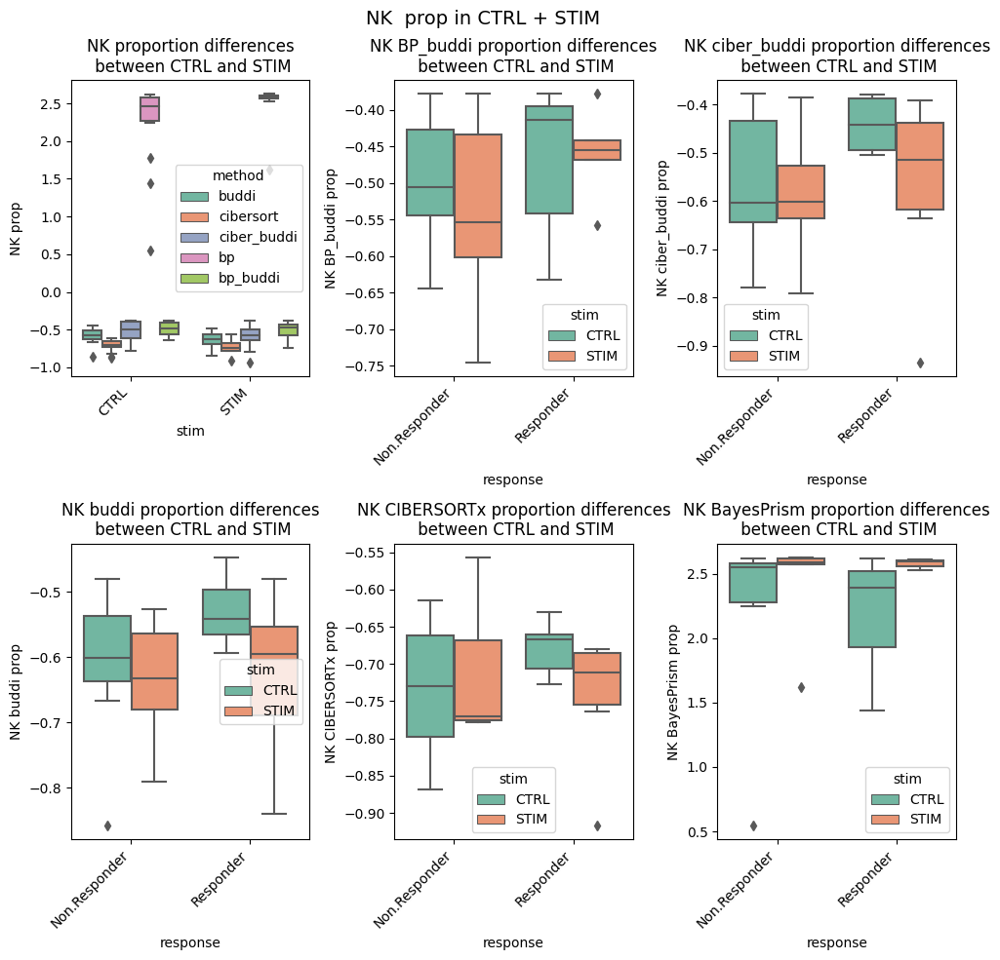

In [630]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "NK")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/1176364474.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


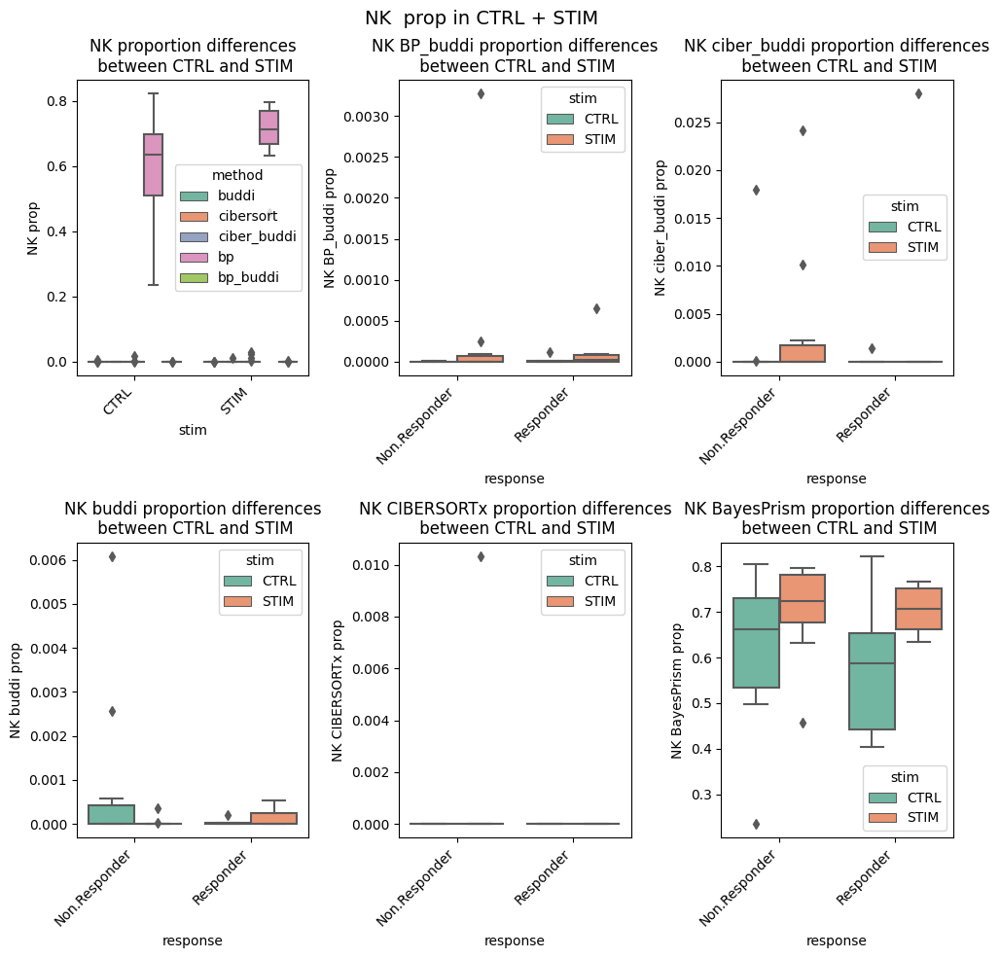

In [631]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "NK")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2246448828.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


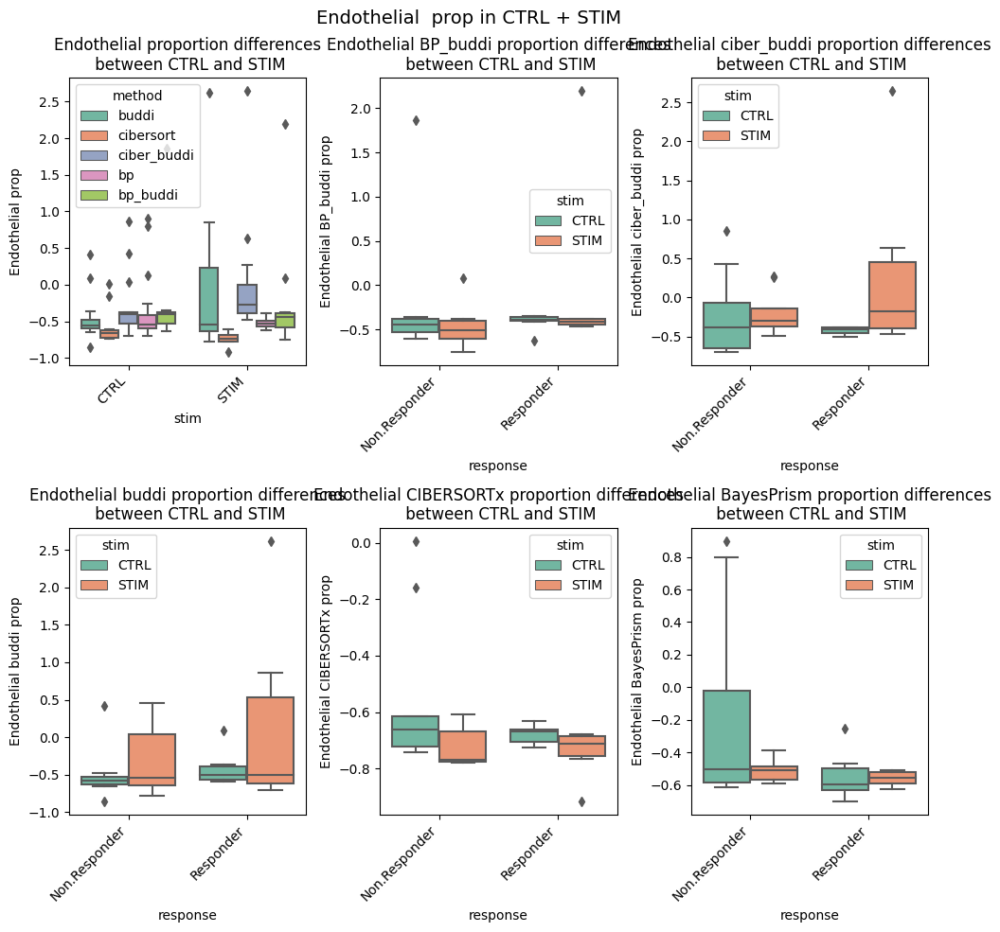

In [632]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "Endothelial")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/1987387284.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


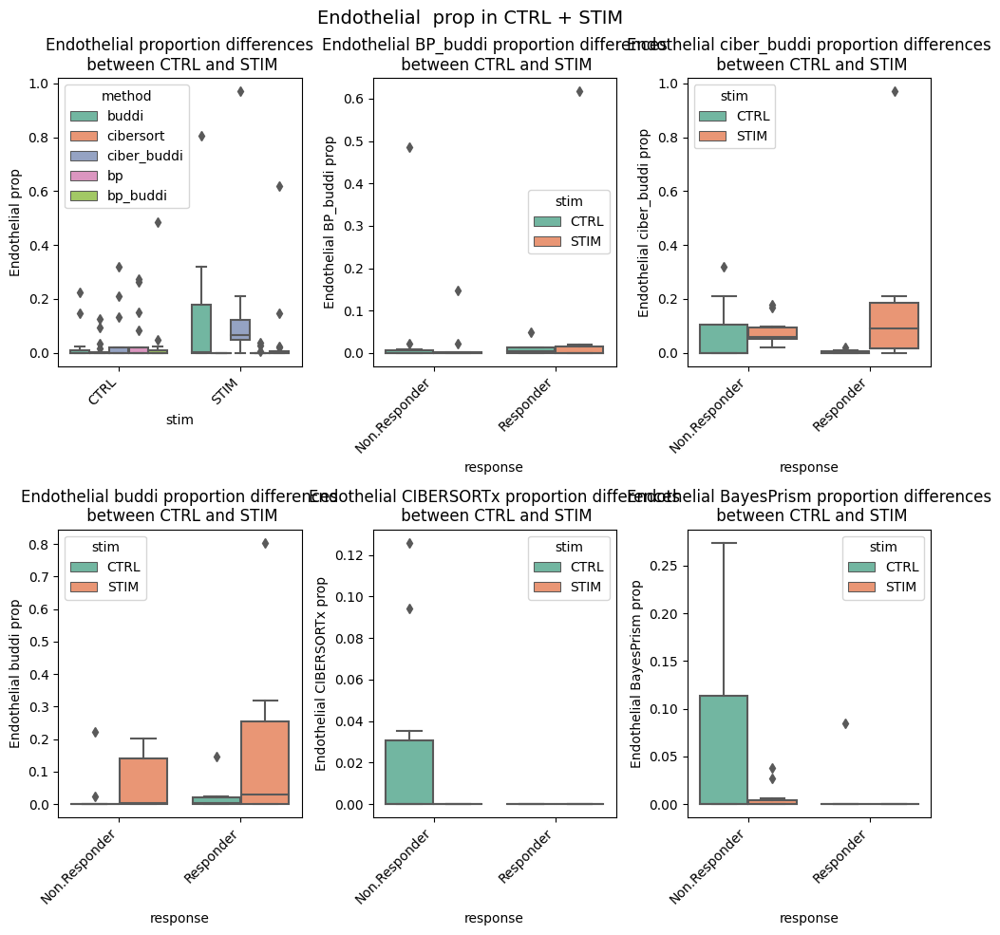

In [633]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "Endothelial")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/305287917.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


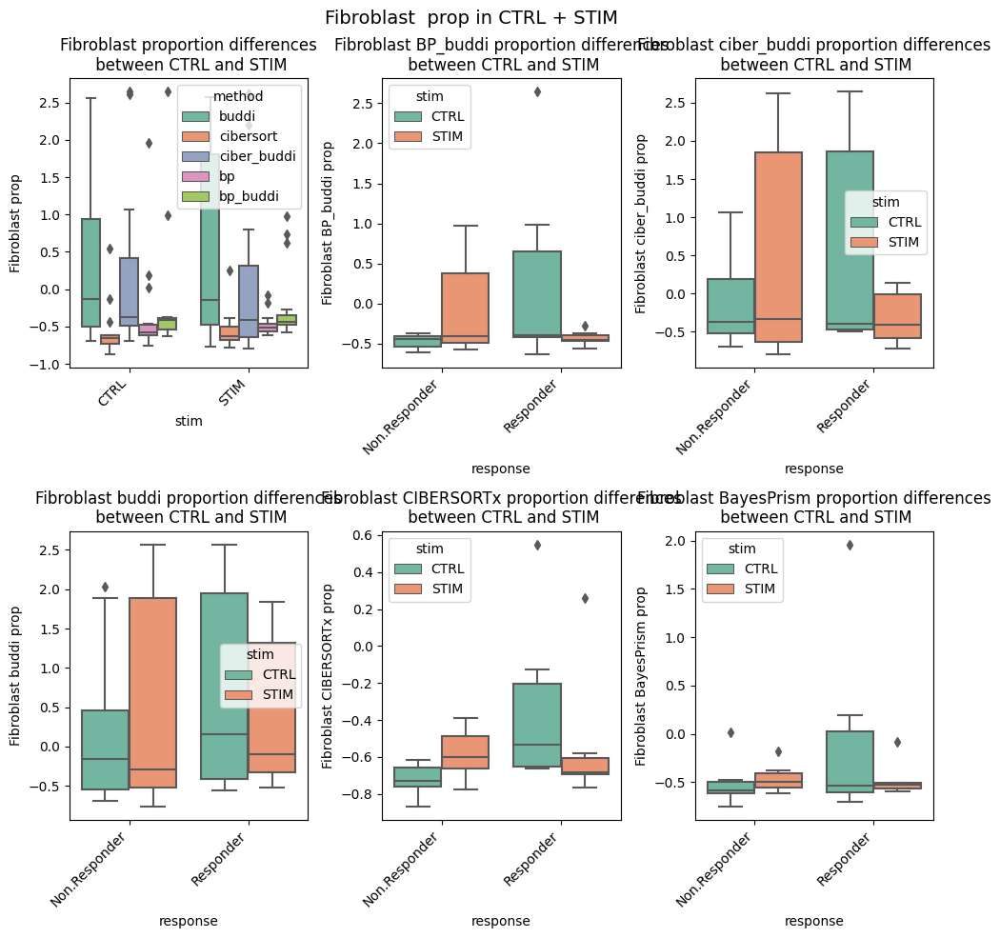

In [634]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "Fibroblast")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2484058398.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


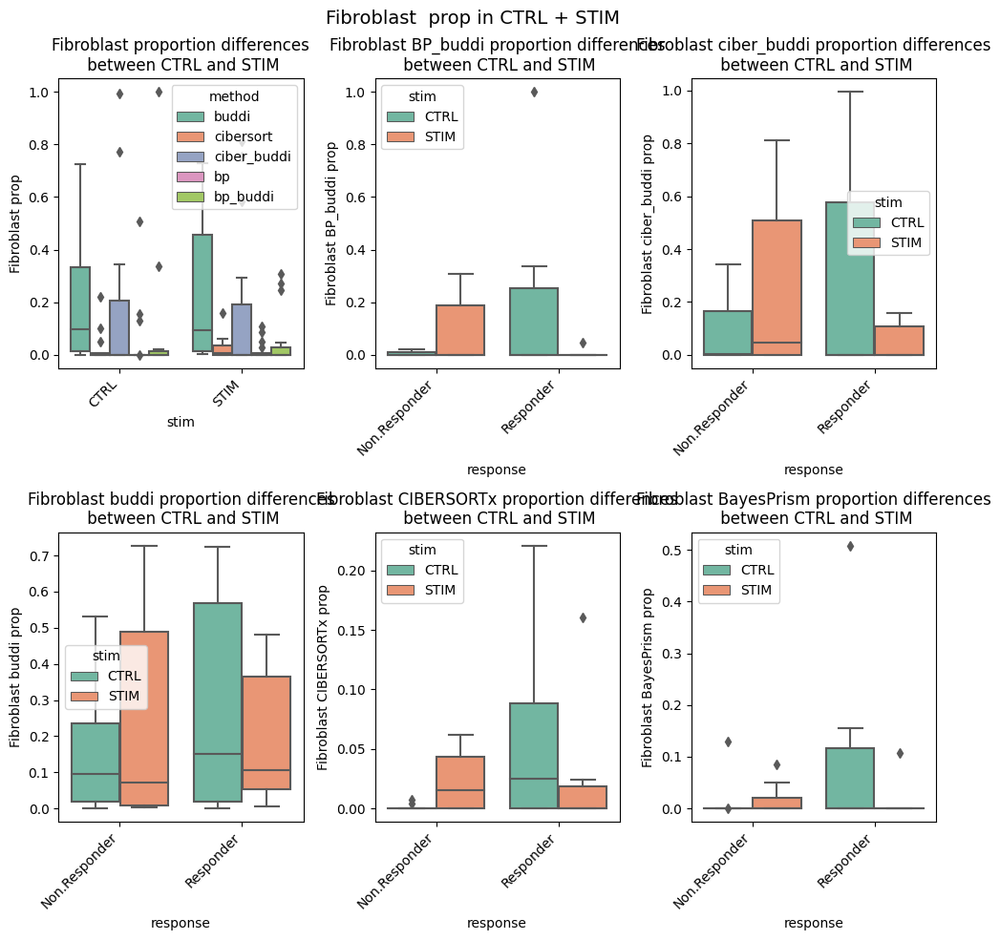

In [635]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "Fibroblast")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/509207274.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


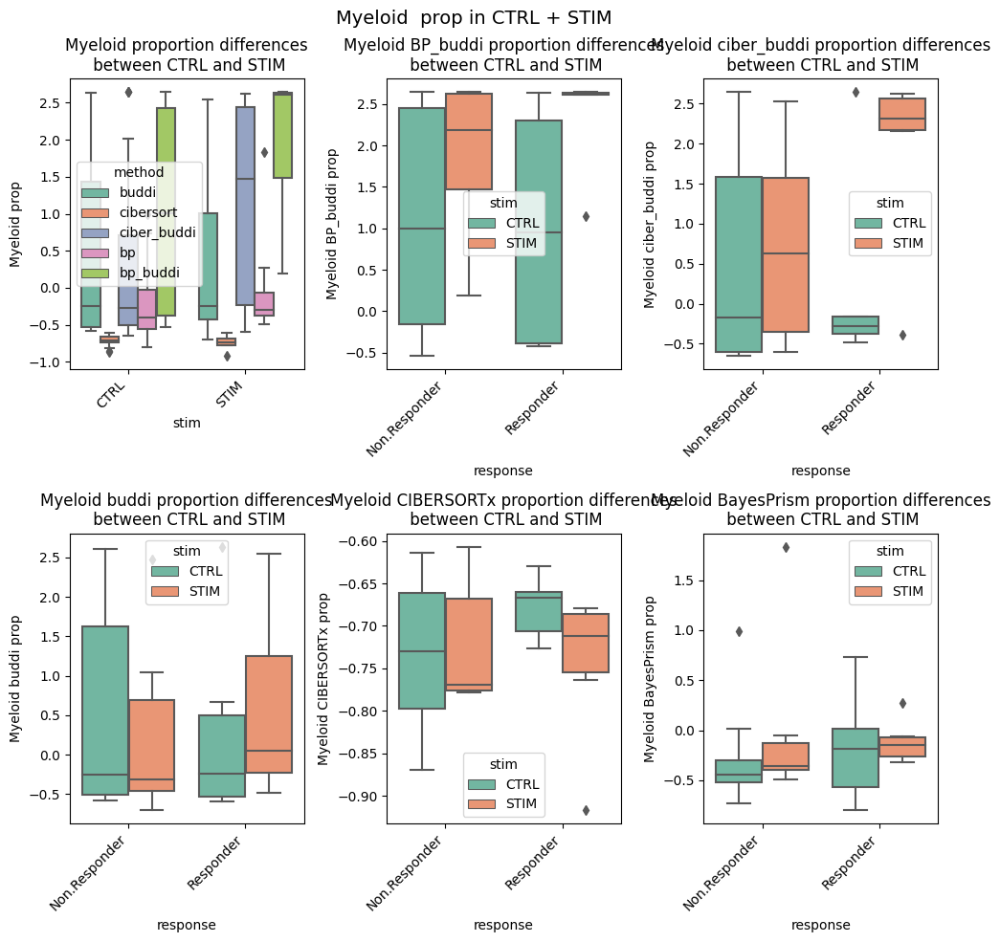

In [636]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_scaled_df, "Myeloid")

fig.show()

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/1236846114.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


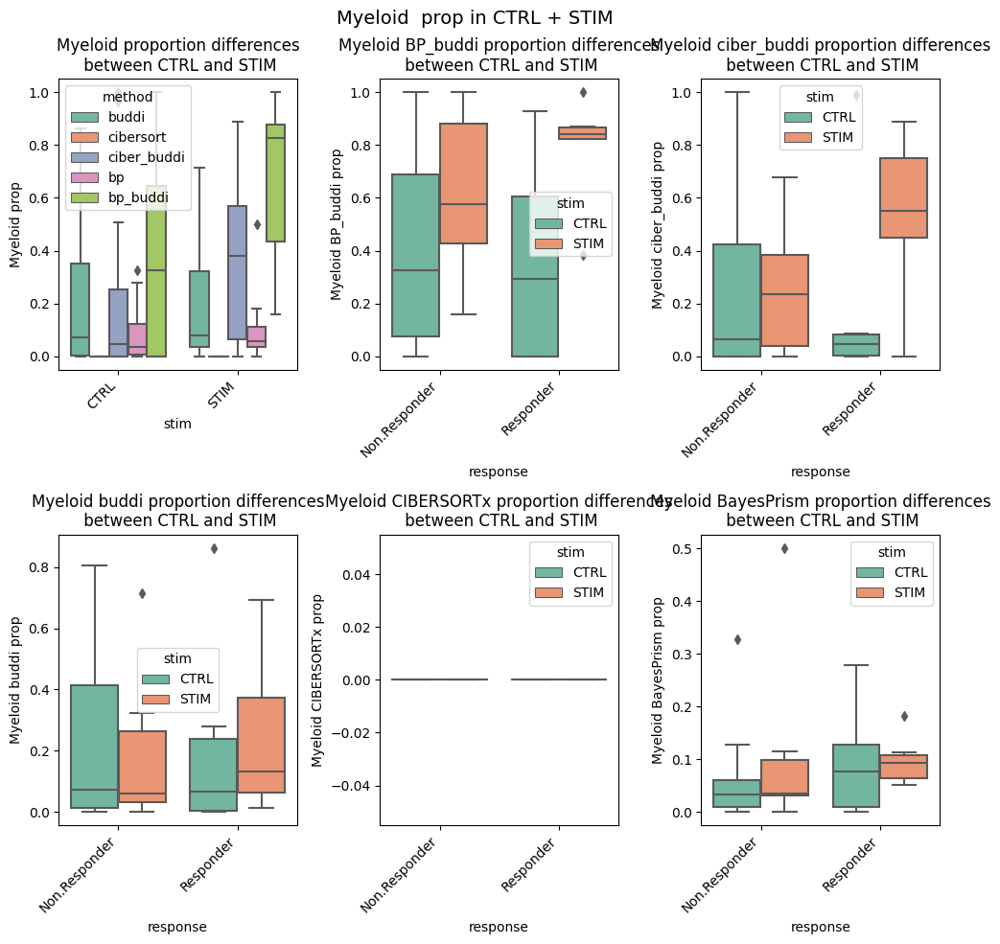

In [637]:
fig, axs = plt.subplots(2, 3, figsize=(10,10))

fig, axs = plot_cell_diff(fig, axs, temp_meta_df, "Myeloid")

fig.show()

In [638]:
prop_df

,NK,B,Endothelial,Fibroblast,Myeloid,T_other,T_CD4,T_CD8
0,0.280000,0.230000,0.100000,0.160000,0.090000,0.035000,0.050000,0.055000
0,0.025000,0.025000,0.080000,0.105000,0.020000,0.670000,0.005000,0.070000
0,0.020000,0.215000,0.085000,0.005000,0.105000,0.235000,0.325000,0.010000
0,0.050000,0.040000,0.785000,0.005000,0.040000,0.070000,0.005000,0.005000
0,0.200000,0.020000,0.025000,0.140000,0.010000,0.395000,0.070000,0.140000
...,...,...,...,...,...,...,...,...
0,0.020373,0.007862,0.040215,0.016375,0.050002,0.023135,0.018347,0.823690
0,0.007053,0.004978,0.016621,0.007082,0.038712,0.013885,0.004684,0.906986
0,0.015002,0.003867,0.002392,0.001159,0.001929,0.004291,0.002290,0.969070
0,0.013469,0.026442,0.002526,0.003351,0.012330,0.009654,0.007583,0.924645


In [639]:
cibersort_bulk = cibersort_bulk.sort_values(by=['sample_id', 'stim'], ascending=False)
buddi_bulk = buddi_bulk.sort_values(by=['sample_id', 'stim'], ascending=False)
bp_bulk = bp_bulk.sort_values(by=['sample_id', 'stim'], ascending=False)
ciber_buddi = ciber_buddi.sort_values(by=['sample_id', 'stim'], ascending=False)
bp_buddi = bp_buddi.sort_values(by=['sample_id', 'stim'], ascending=False)


print(cibersort_bulk.sample_id.to_list() == buddi_bulk.sample_id.to_list())
print(cibersort_bulk.stim.to_list() == buddi_bulk.stim.to_list())


print(bp_bulk.sample_id.to_list() == buddi_bulk.sample_id.to_list())
print(bp_bulk.stim.to_list() == buddi_bulk.stim.to_list())

print(ciber_buddi.sample_id.to_list() == buddi_bulk.sample_id.to_list())
print(ciber_buddi.stim.to_list() == buddi_bulk.stim.to_list())

print(bp_buddi.sample_id.to_list() == buddi_bulk.sample_id.to_list())
print(bp_buddi.stim.to_list() == buddi_bulk.stim.to_list())

True
True
True
True
True
True
True
True


In [640]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]
label_temp[idx_tmp] == bp_bulk.sample_id.to_list()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False])

/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/405543898.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


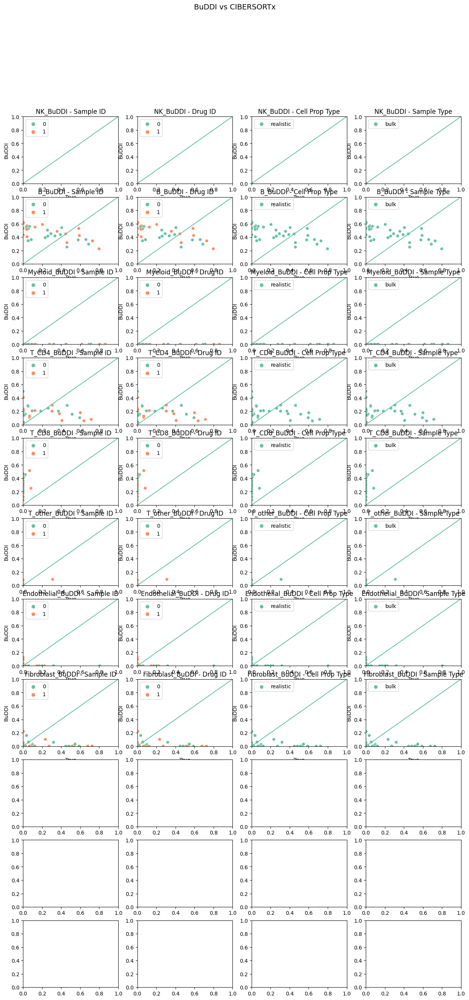

In [641]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]
bp_buddi_plot = ciber_buddi[cell_type_list]



fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("BuDDI vs CIBERSORTx", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/3787754544.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


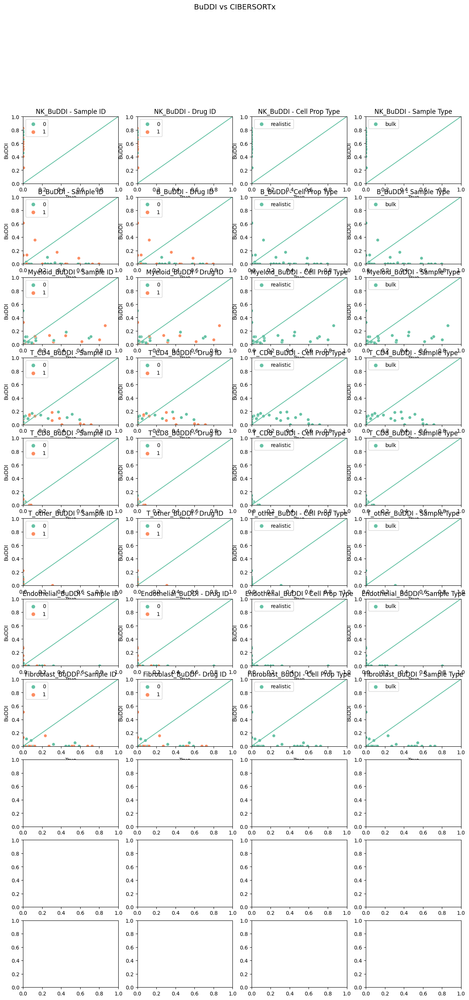

In [642]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]




fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("BuDDI vs CIBERSORTx", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/1673941734.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


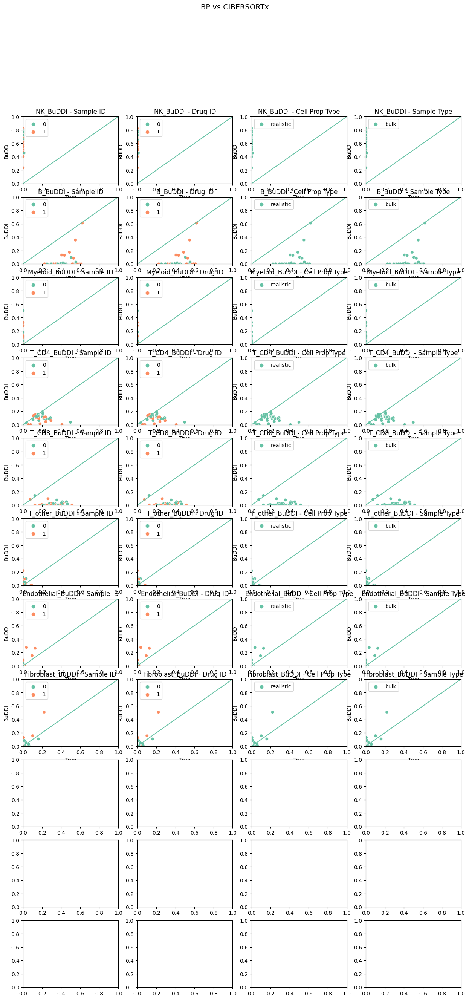

In [643]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]




fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("BP vs CIBERSORTx", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/1084764042.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


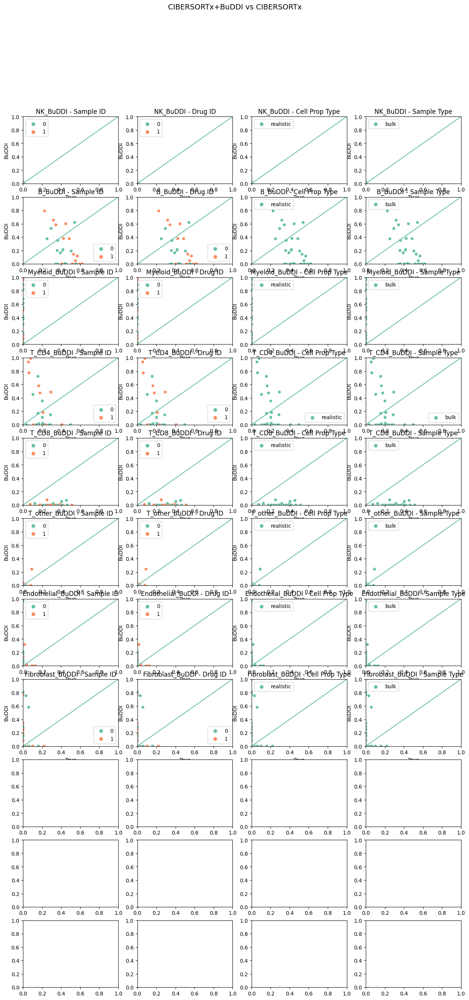

In [644]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]




fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(cibersort_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("CIBERSORTx+BuDDI vs CIBERSORTx", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2995015413.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


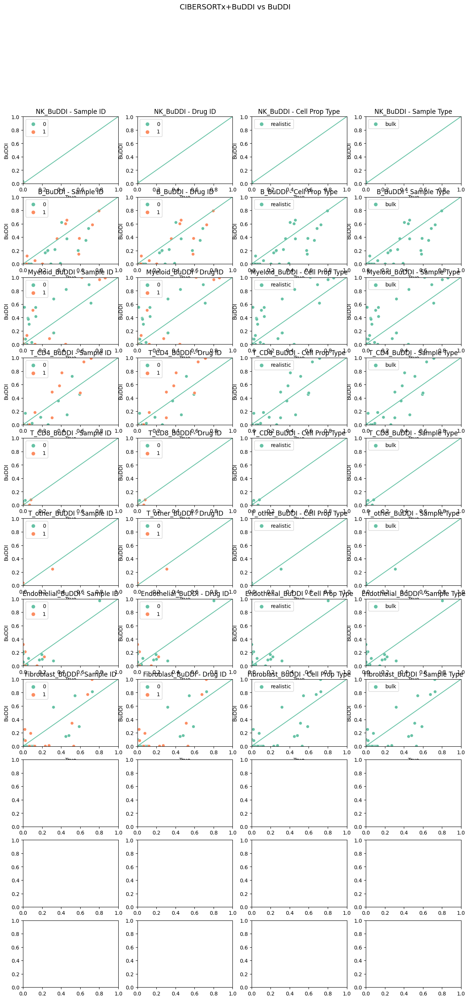

In [645]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]




fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("CIBERSORTx+BuDDI vs BuDDI", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/2573576565.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


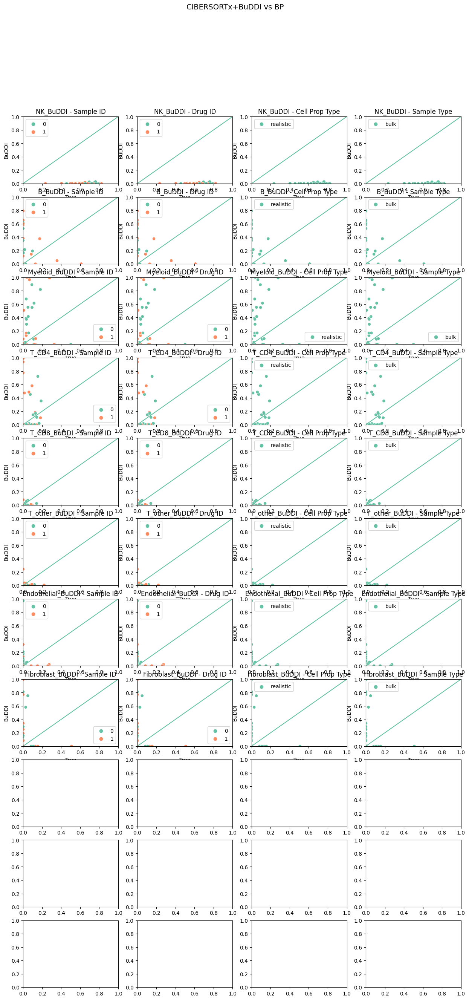

In [646]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]




fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("CIBERSORTx+BuDDI vs BP", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/970072088.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


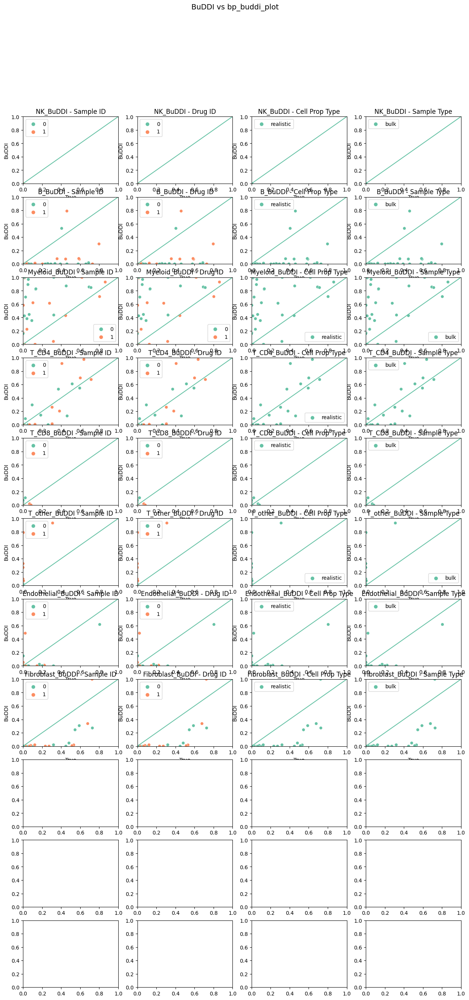

In [647]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]
bp_buddi_plot = bp_buddi[cell_type_list]



fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(buddi_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("BuDDI vs bp_buddi_plot", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/4101323533.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


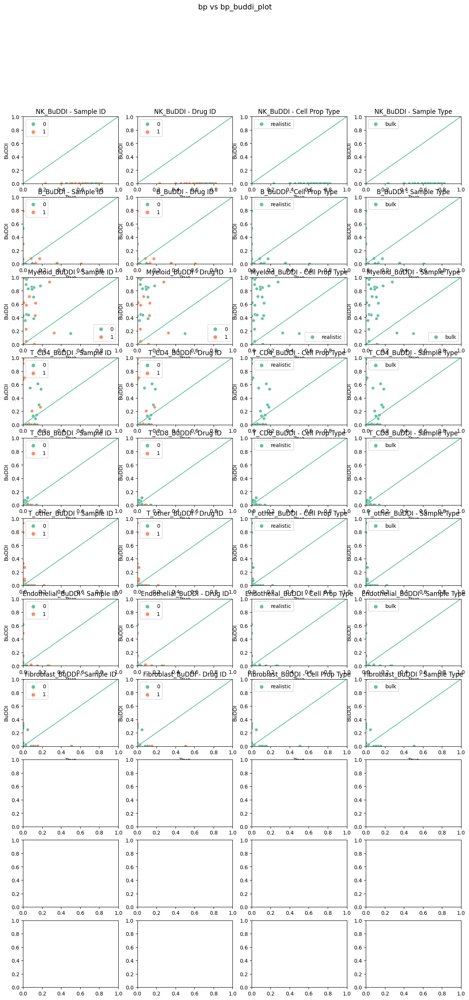

In [648]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]

buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]
bp_buddi_plot = bp_buddi[cell_type_list]




fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(bp_bulk_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("bp vs bp_buddi_plot", fontsize=14)

fig.show()


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_6830/1910875977.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


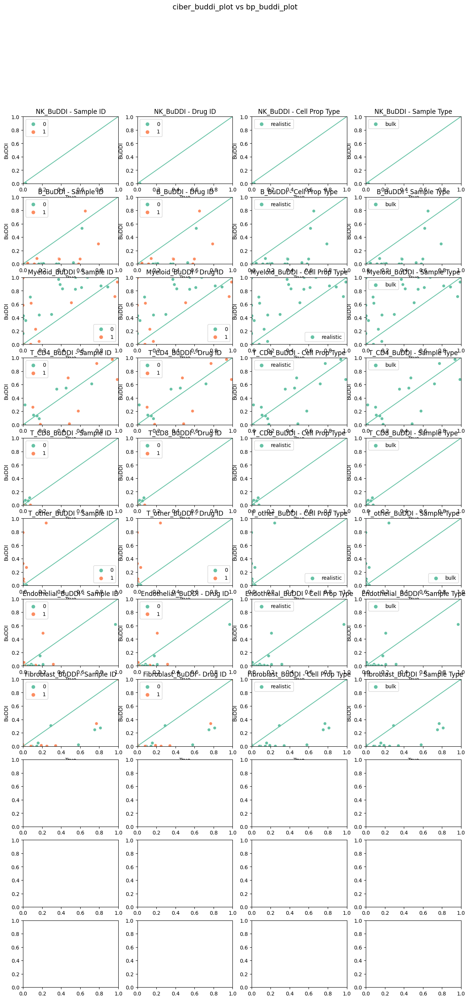

In [649]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]

cell_type_list = ["NK", "B", "Myeloid", "T_CD4", "T_CD8", "T_other", "Endothelial", "Fibroblast"]


buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]
bp_buddi_plot = bp_buddi[cell_type_list]



fig, axs = plt.subplots(11, 4, figsize=(15,30))
row_idx = 0
for curr_cell in buddi_bulk_plot.columns:

    vp.plot_cell_specific_corr(ciber_buddi_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(ciber_buddi_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(ciber_buddi_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(ciber_buddi_plot[curr_cell], bp_buddi_plot[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("ciber_buddi_plot vs bp_buddi_plot", fontsize=14)

fig.show()


In [650]:
def get_prop_corr(buddi_bulk_plot, bp_bulk_plot, cibersort_bulk_plot, ciber_buddi_plot, bp_buddi_plot, curr_cell):
    buddi_bp = spearmanr(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0]
    buddi_bpbuddi = spearmanr(bp_bulk_plot[curr_cell], bp_buddi_plot[curr_cell])[0]

    buddi_cibersort = spearmanr(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0]
    buddi_cibersortbuddi = spearmanr(cibersort_bulk_plot[curr_cell], ciber_buddi_plot[curr_cell])[0]

    
    bp_cibersort = spearmanr(bp_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0]
    bpbuddi_cibersortbuddi = spearmanr(bp_buddi_plot[curr_cell], ciber_buddi_plot[curr_cell])[0]

    return np.array([buddi_bp, buddi_bpbuddi, buddi_cibersort, buddi_cibersortbuddi, bp_cibersort, bpbuddi_cibersortbuddi])
    

In [651]:
columns_ids = ["buddi_bp", "buddi_bpbuddi", "buddi_cibersort",
                "buddi_cibersortbuddi", "bp_cibersort",
                "bpbuddi_cibersortbuddi"]

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


<AxesSubplot: >

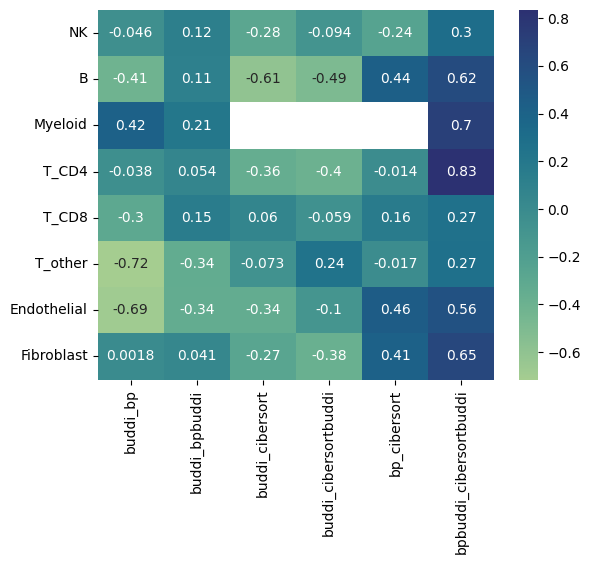

In [652]:
all_corr = None

for curr_cell in buddi_bulk_plot.columns:
    curr_corr = get_prop_corr(buddi_bulk_plot, bp_bulk_plot, cibersort_bulk_plot, ciber_buddi_plot, bp_buddi_plot, curr_cell)

    if all_corr is None:
        all_corr = curr_corr
    else:
        all_corr = np.vstack([all_corr, curr_corr])

all_corr = pd.DataFrame(all_corr, columns=columns_ids, index=buddi_bulk_plot.columns)
sns.heatmap(all_corr, annot=True, cmap="crest")

In [653]:
np.nanmean(all_corr, axis=0)

array([-0.22328629,  0.00096224, -0.26714724, -0.18224811,  0.17111068,
        0.52440014])

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


<AxesSubplot: >

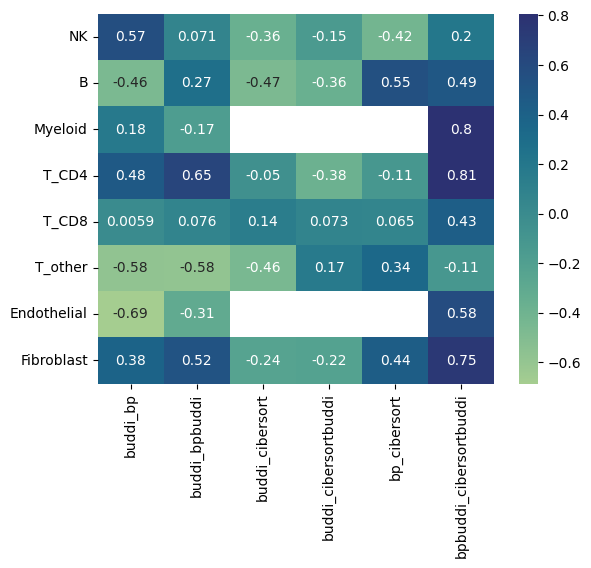

In [654]:
all_corr_stim = None

stim_idx = np.where(buddi_bulk.stim == "STIM")[0]

for curr_cell in buddi_bulk_plot.columns:
    curr_corr = get_prop_corr(buddi_bulk_plot.iloc[stim_idx], bp_bulk_plot.iloc[stim_idx], 
                              cibersort_bulk_plot.iloc[stim_idx], ciber_buddi_plot.iloc[stim_idx], 
                              bp_buddi_plot.iloc[stim_idx], curr_cell)

    if all_corr_stim is None:
        all_corr_stim = curr_corr
    else:
        all_corr_stim = np.vstack([all_corr_stim, curr_corr])

all_corr_stim = pd.DataFrame(all_corr_stim, columns=columns_ids, index=buddi_bulk_plot.columns)
sns.heatmap(all_corr_stim, annot=True, cmap="crest")

In [655]:
np.nanmean(all_corr_stim, axis=0)

array([-0.01286765,  0.06617647, -0.23891714, -0.14421384,  0.14414996,
        0.49416419])

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


<AxesSubplot: >

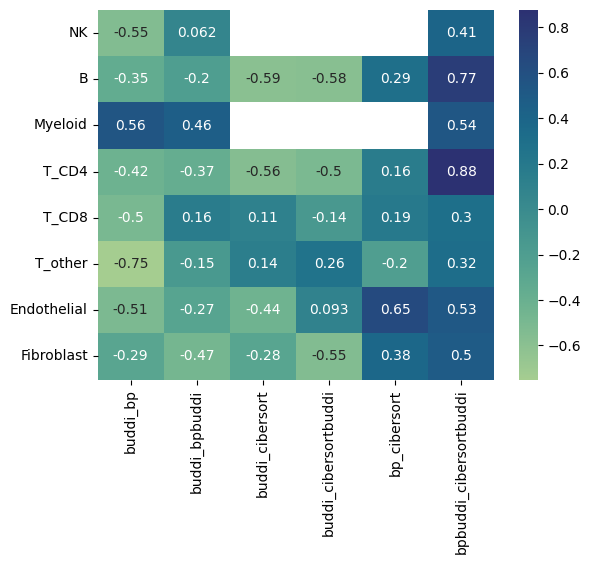

In [656]:
all_corr_ctrl = None

ctrl_idx = np.where(buddi_bulk.stim == "CTRL")[0]

for curr_cell in buddi_bulk_plot.columns:
    curr_corr = get_prop_corr(buddi_bulk_plot.iloc[ctrl_idx], bp_bulk_plot.iloc[ctrl_idx], 
                              cibersort_bulk_plot.iloc[ctrl_idx], ciber_buddi_plot.iloc[ctrl_idx], 
                              bp_buddi_plot.iloc[ctrl_idx], curr_cell)

    if all_corr_ctrl is None:
        all_corr_ctrl = curr_corr
    else:
        all_corr_ctrl = np.vstack([all_corr_ctrl, curr_corr])


all_corr_ctrl = pd.DataFrame(all_corr_ctrl, columns=columns_ids, index=buddi_bulk_plot.columns)
sns.heatmap(all_corr_ctrl, annot=True, cmap="crest")




In [657]:
np.nanmean(all_corr_ctrl, axis=0)

array([-0.35220588, -0.09595588, -0.26943794, -0.23805262,  0.24572686,
        0.5297316 ])

In [658]:

buddi_bulk_plot = buddi_bulk[cell_type_list]
ciber_buddi_plot = ciber_buddi[cell_type_list]
cibersort_bulk_plot = cibersort_bulk[cell_type_list]
bp_bulk_plot = bp_bulk[cell_type_list]
bp_buddi_plot = bp_buddi[cell_type_list]


In [659]:
def get_samp_corr(buddi_bulk_plot, bp_bulk_plot, cibersort_bulk_plot, ciber_buddi_plot, bp_buddi_plot):

    buddi_bp_corr = []
    buddi_bpbuddi_corr = []
    buddi_cibersort_corr = []
    buddi_cibersortbuddi_corr = []
    bp_cibersort_corr = []
    bpbuddi_cibersortbuddi_corr = []

    for curr_idx in range(len(buddi_bulk_plot)):
        buddi_bp_corr.append(spearmanr(buddi_bulk_plot.iloc[curr_idx], bp_bulk_plot.iloc[curr_idx])[0])
        buddi_bpbuddi_corr.append(spearmanr(bp_bulk_plot.iloc[curr_idx], bp_buddi_plot.iloc[curr_idx])[0])

        buddi_cibersort_corr.append(spearmanr(buddi_bulk_plot.iloc[curr_idx], cibersort_bulk_plot.iloc[curr_idx])[0])
        buddi_cibersortbuddi_corr.append(spearmanr(cibersort_bulk_plot.iloc[curr_idx], ciber_buddi_plot.iloc[curr_idx])[0])

        
        bp_cibersort_corr.append(spearmanr(bp_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0])
        bpbuddi_cibersortbuddi_corr.append(spearmanr(bp_buddi_plot[curr_cell], ciber_buddi_plot[curr_cell])[0])

        return np.array([np.median(buddi_bp_corr), 
                        np.median(buddi_bpbuddi_corr), 
                        np.median(buddi_cibersort_corr), 
                        np.median(buddi_cibersortbuddi_corr), 
                        np.median(bp_cibersort_corr), 
                        np.median(bpbuddi_cibersortbuddi_corr)])

In [660]:
import scipy as sp
sp.stats.zscore(bp_buddi_plot.iloc[0:10], axis=1)


,NK,B,Myeloid,T_CD4,T_CD8,T_other,Endothelial,Fibroblast
19,-0.579516,-0.542757,1.487571,1.952778,-0.579514,-0.579523,-0.579518,-0.579520
18,-0.546485,-0.207791,0.435451,2.504786,-0.546490,-0.546491,-0.546487,-0.546493
17,-0.428010,-0.428000,2.626302,-0.428011,-0.058255,-0.428009,-0.428000,-0.428016
16,-0.610450,-0.264746,2.420087,0.663528,-0.610470,-0.376983,-0.610482,-0.610484
15,-0.557265,-0.557265,1.148865,-0.557268,-0.557266,-0.557267,2.194730,-0.557265
14,-0.631711,0.878140,2.313188,-0.605216,-0.540205,-0.150756,-0.631719,-0.631720
13,-0.443616,-0.445918,2.608755,0.063700,-0.445154,-0.445923,-0.445922,-0.445922
12,-0.417928,-0.148653,-0.417921,2.635657,-0.417927,-0.417929,-0.397370,-0.417928
11,-0.451038,-0.432861,2.605499,-0.451043,-0.451038,-0.451043,0.082563,-0.451040
10,-0.486712,2.587405,0.170628,-0.486719,-0.486714,-0.483700,-0.399066,-0.415123


In [661]:
import scipy as sp
sp.stats.zscore(ciber_buddi_plot.iloc[0:10], axis=1)

,NK,B,Myeloid,T_CD4,T_CD8,T_other,Endothelial,Fibroblast
19,-0.773143,0.417721,1.079855,2.021511,-0.773143,-0.773143,-0.426513,-0.773143
18,-0.595344,1.399879,0.037898,1.937226,-0.694915,-0.694915,-0.694915,-0.694915
17,-0.791693,1.580744,1.673421,-0.791693,-0.351904,-0.791693,0.264509,-0.791693
16,-0.658056,1.347142,2.015602,-0.116787,-0.658425,-0.612625,-0.658425,-0.658425
15,-0.391168,-0.391168,-0.391168,-0.340741,-0.391168,-0.348656,2.645236,-0.391168
14,-0.483439,2.577179,-0.483439,0.220237,-0.483439,-0.462142,-0.401519,-0.483439
13,-0.429077,-0.429077,2.625407,-0.050943,-0.429077,-0.429077,-0.429077,-0.429077
12,-0.499073,0.082250,-0.178417,2.591531,-0.499073,-0.499073,-0.499073,-0.499073
11,-0.620375,0.374878,2.429091,-0.620375,-0.620375,-0.589910,0.267442,-0.620375
10,-0.556472,2.353074,-0.556472,-0.556472,-0.505504,-0.480657,0.858973,-0.556472


<AxesSubplot: >

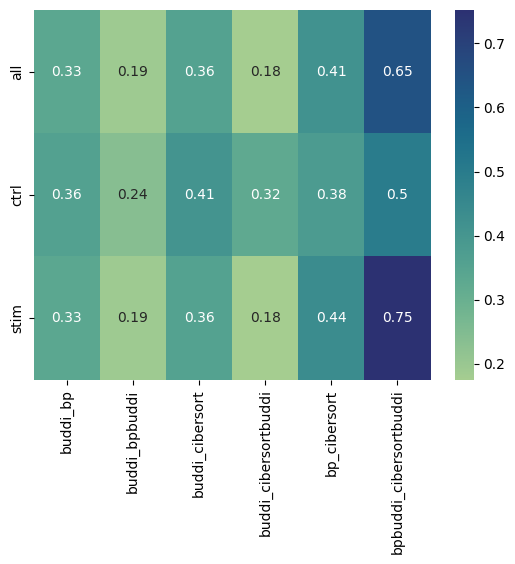

In [662]:
all_samp_corr = get_samp_corr(buddi_bulk_plot, bp_bulk_plot, cibersort_bulk_plot, ciber_buddi_plot, bp_buddi_plot)

ctrl_idx = np.where(buddi_bulk.stim == "CTRL")[0]
ctrl_samp_corr = get_samp_corr(buddi_bulk_plot.iloc[ctrl_idx], bp_bulk_plot.iloc[ctrl_idx], 
                               cibersort_bulk_plot.iloc[ctrl_idx], ciber_buddi_plot.iloc[ctrl_idx], 
                               bp_buddi_plot.iloc[ctrl_idx])

stim_idx = np.where(buddi_bulk.stim == "STIM")[0]
stim_samp_corr = get_samp_corr(buddi_bulk_plot.iloc[stim_idx], bp_bulk_plot.iloc[stim_idx], 
                               cibersort_bulk_plot.iloc[stim_idx], ciber_buddi_plot.iloc[stim_idx], 
                               bp_buddi_plot.iloc[stim_idx])


all_samp_corr = np.vstack([all_samp_corr, ctrl_samp_corr, stim_samp_corr])
all_samp_corr = pd.DataFrame(all_samp_corr, columns=columns_ids, index=["all", "ctrl", "stim"])
sns.heatmap(all_samp_corr, annot=True, cmap="crest")


In [663]:
curr_cell = "T_CD8"
print(curr_cell)
print(f"Buddi v BP {np.coerrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

T_CD8


AttributeError: module 'numpy' has no attribute 'coerrcoef'

In [ ]:
curr_cell = "T_CD4"
print(curr_cell)
print(f"Buddi v BP {np.corrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

T_CD4
Buddi v BP -0.24878989463309475
Buddi v Cibersort -0.35689071936876654
Cibersort v BP -0.0004081477673899222


In [ ]:
curr_cell = "T_other"
print(curr_cell)
print(f"Buddi v BP {np.corrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

T_other
Buddi v BP -0.1395035333220915
Buddi v Cibersort 0.6708987933090451
Cibersort v BP -0.12291665272970184


In [ ]:
curr_cell = "NK"
print(curr_cell)
print(f"Buddi v BP {np.corrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

NK
Buddi v BP -0.595595856121214
Buddi v Cibersort -0.053299975448159224
Cibersort v BP -0.2605329954564436


In [ ]:
curr_cell = "B"
print(curr_cell)
print(f"Buddi v BP {np.corrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

B
Buddi v BP -0.28136443511556364
Buddi v Cibersort -0.626898061511203
Cibersort v BP 0.3721915783967314


In [ ]:
curr_cell = "Myeloid"
print(curr_cell)
print(f"Buddi v BP {np.corrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

Myeloid
Buddi v BP 0.17297203083847296
Buddi v Cibersort nan
Cibersort v BP nan


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [ ]:
curr_cell = "Fibroblast"
print(curr_cell)
print(f"Buddi v BP {np.corrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

Fibroblast
Buddi v BP -0.1943160894014515
Buddi v Cibersort -0.2436801818401651
Cibersort v BP 0.82320557621134


In [ ]:
curr_cell = "Endothelial"
print(curr_cell)
print(f"Buddi v BP {np.corrcoef(buddi_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")
print(f"Buddi v Cibersort {np.corrcoef(buddi_bulk_plot[curr_cell], cibersort_bulk_plot[curr_cell])[0,1]}")
print(f"Cibersort v BP {np.corrcoef(cibersort_bulk_plot[curr_cell], bp_bulk_plot[curr_cell])[0,1]}")

Endothelial
Buddi v BP -0.16929564636751906
Buddi v Cibersort -0.1383059512063524
Cibersort v BP 0.8200082931732323
